
# ROAD IMAGE SEGMENTATION <br>
## Mini Project 3 - Visual Computing Lab
<br>
Name: Haardik Ravat<br>
Roll No.: B20EE021

## Libraries

In [4]:
import os
import cv2
import glob
import torch
import tqdm
import datetime
import numpy as np
from PIL import Image
import torch.nn as nn
import albumentations as A
from torch import from_numpy
import torch.nn.functional as F
from torch.nn import DataParallel
from sklearn.cluster import KMeans
from matplotlib import pyplot as plt
from torch.nn import CrossEntropyLoss
from torch.optim import SGD, Adam, lr_scheduler
from torch.utils.data import Dataset, DataLoader

## Parameters

In [5]:
INPUT_IMG_SIZE = 128

OUTPUT_CLASSES = 12

LEARINING_RATE = 0.01

OPIMIZER_NAME = 'Adam'

SCHEDULER_NAME = 'stepLR'

BATCH_SIZE = 8

MAX_EPOCHS = 10

AUGMENTATION = False

MEAN = None

STD = None

THRESH_ACC_CKP = 0.9

SCHEDULER_STEP_SIZE = 4

USE_CUDA = torch.cuda.is_available()

INPUT_PATH = './segdata128/reduced'

INPUT_PATH_MASK = './segdata128/reduced_mask'

## Importing and Analysing Dataset

In [6]:
!gdown -O cityscape128.zip "https://drive.google.com/u/0/uc?id=1XUWaL2ijz1vjbKbxJ6TYkG4QZgIsiZu_&export=download"

Downloading...
From: https://drive.google.com/u/0/uc?id=1XUWaL2ijz1vjbKbxJ6TYkG4QZgIsiZu_&export=download
To: /content/cityscape128.zip
100% 50.1M/50.1M [00:01<00:00, 32.1MB/s]


In [7]:
!unzip cityscape128.zip

Streaming output truncated to the last 5000 lines.
  inflating: segdata128/reduced_mask/train/1114.jpg  
  inflating: segdata128/reduced_mask/train/294.jpg  
  inflating: segdata128/reduced_mask/train/886.jpg  
  inflating: segdata128/reduced_mask/train/1816.jpg  
  inflating: segdata128/reduced_mask/train/1187.jpg  
  inflating: segdata128/reduced_mask/train/1723.jpg  
  inflating: segdata128/reduced_mask/train/312.jpg  
  inflating: segdata128/reduced_mask/train/2565.jpg  
  inflating: segdata128/reduced_mask/train/1232.jpg  
  inflating: segdata128/reduced_mask/train/2628.jpg  
  inflating: segdata128/reduced_mask/train/2630.jpg  
  inflating: segdata128/reduced_mask/train/2744.jpg  
  inflating: segdata128/reduced_mask/train/1149.jpg  
  inflating: segdata128/reduced_mask/train/1026.jpg  
  inflating: segdata128/reduced_mask/train/1354.jpg  
  inflating: segdata128/reduced_mask/train/989.jpg  
  inflating: segdata128/reduced_mask/train/487.jpg  
  inflating: segdata128/reduced_mask

In [8]:
train_files = glob.glob(os.path.join(INPUT_PATH + '/train', '*jpg'))
train_files_mask = glob.glob(os.path.join(INPUT_PATH_MASK + '/train', '*jpg'))
test_files = glob.glob(os.path.join(INPUT_PATH + '/val', '*jpg'))
test_files_mask = glob.glob(os.path.join(INPUT_PATH_MASK + '/val', '*jpg'))


In [9]:
print('Total train images:', len(train_files))
print('Total train mask:', len(train_files_mask))

print('Total test images:', len(test_files))
print('Total test mask:', len(test_files_mask))

Total train images: 2975
Total train mask: 2975
Total test images: 500
Total test mask: 500


In [10]:
train_files_length = len(train_files)
train_mask_length = len(train_files_mask)
test_files_length = len(test_files)
test_mask_length = len(test_files_mask)

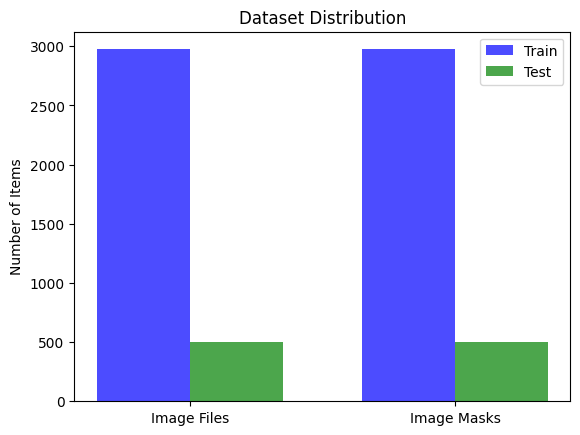

In [11]:
keys = ['Image Files', 'Image Masks']
train_values = [train_files_length, train_mask_length]
test_values = [test_files_length, test_mask_length]

bar_width = 0.35
index = range(len(keys))

plt.bar(index, train_values, bar_width, label='Train', alpha=0.7, color='b', align='center')
plt.bar([i + bar_width for i in index], test_values, bar_width, label='Test', alpha=0.7, color='g', align='center')

plt.ylabel('Number of Items')
plt.title('Dataset Distribution')
plt.xticks([i + bar_width/2 for i in index], keys)
plt.legend()

plt.show()


## Kmeans Clustering

In [48]:
kmeans_data = []
for i in train_files_mask[:150]:
    org_img = cv2.imread(i)

    msk = org_img
    kmeans_data.append(msk)
kmeans_data = np.array(kmeans_data)
kmeans_data = kmeans_data.reshape(-1,3)
print(kmeans_data.shape)

(2457600, 3)


In [49]:
encoder = KMeans(n_clusters=OUTPUT_CLASSES)
encoder.fit(kmeans_data)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=12)

In [50]:
colors = {0:[ 42.31849768, 138.68802268, 107.34976084],
       1:[127.04043101,  64.08636608, 127.54335584],
       2:[ 67.73835184,  70.81071668,  69.68390725],
       3:[ 77.50990865,  18.95552339,  73.79703489],
       4:[133.96612288,   3.85362098,   4.37284647],
       5:[217.97385828,  43.76697629, 229.43543734],
       6:[164.94309451, 125.22840326,  81.50394562],
       7:[157.10134385, 155.26893603, 193.22678809],
       8:[ 66.53429189,  32.62107138, 188.45387454],
       9:[157.58165138, 243.49941618, 159.97381151],
       10:[  6.98127537,   5.22420501,   6.82420501],
       11:[ 48.88183862, 203.80514614, 203.66699975]
          }

In [51]:
encoder.cluster_centers_

array([[220.16530323,  42.33514967, 232.02900715],
       [ 67.99893445,  70.22471034,  70.20829946],
       [127.10912722,  63.99802215, 128.25129749],
       [ 41.99624361, 138.21972767, 107.80940478],
       [  6.68110164,   4.56995134,   6.47294976],
       [158.0198619 , 153.9020757 , 200.03002728],
       [132.46301053,   4.25338024,   5.52129719],
       [165.18216895, 125.45028248,  81.51080857],
       [157.56034906, 242.69596917, 160.50874542],
       [ 65.87812528,  32.69225201, 187.7339325 ],
       [ 51.19274557, 199.01323802, 206.67904421],
       [ 74.5477926 ,  12.40241067,  79.19644818]])

## Visualizing dataset

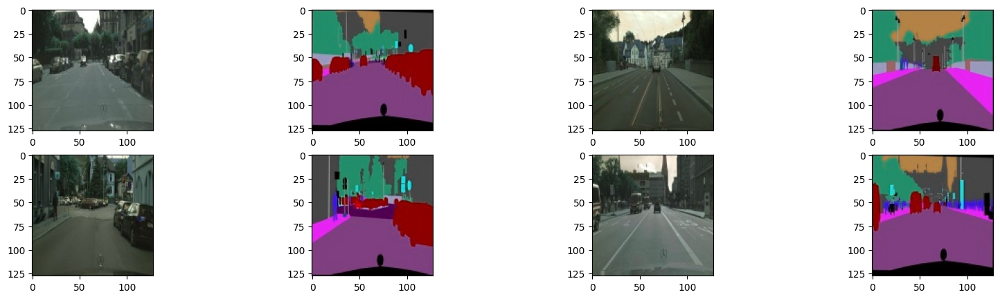

In [52]:
fig, axes = plt.subplots(2,4, figsize = (20,5))
for i, ax in enumerate(axes.ravel()):
    if(i%2==0):
      img = cv2.imread(train_files[i//2])
      ax.imshow(img)
    else:
      mk = cv2.imread(train_files_mask[i//2])
      ax.imshow(mk)
    # break
    #ax.axis('off')
plt.show()

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


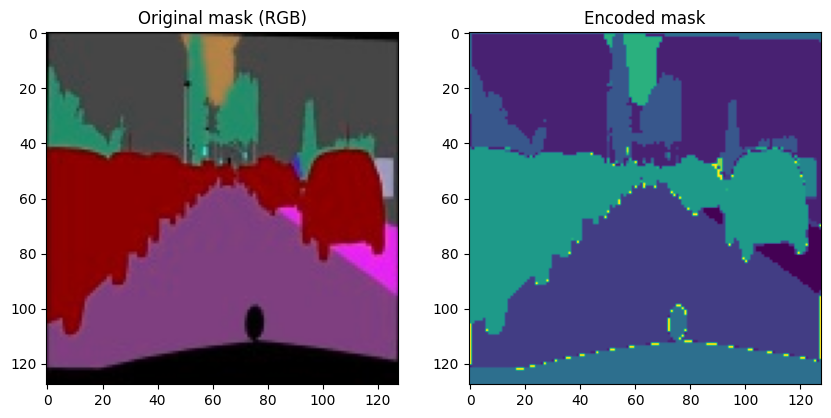

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


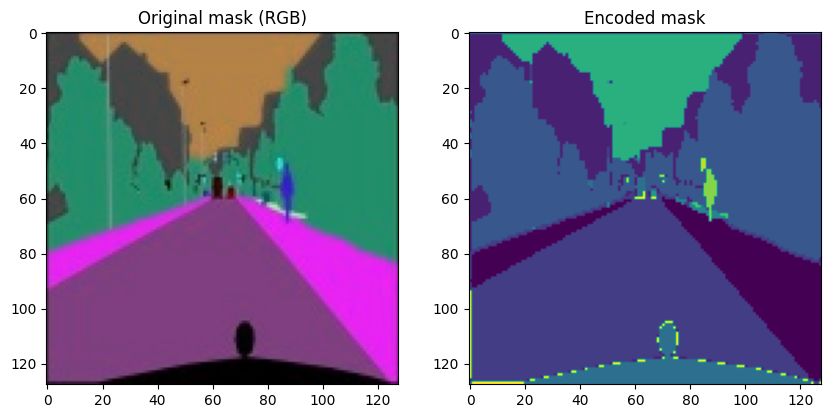

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


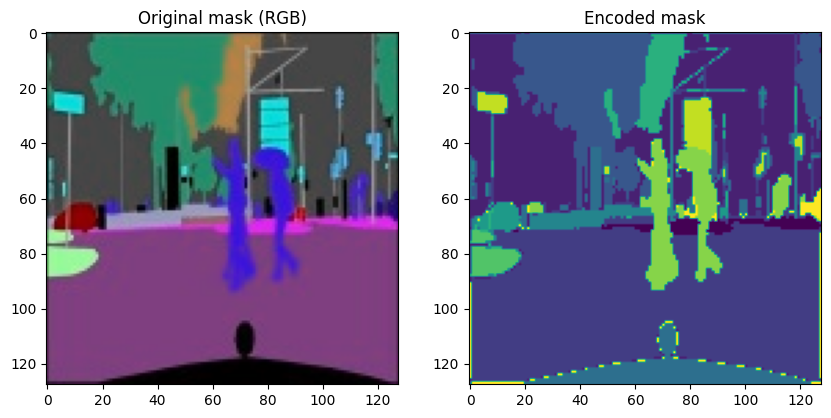

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


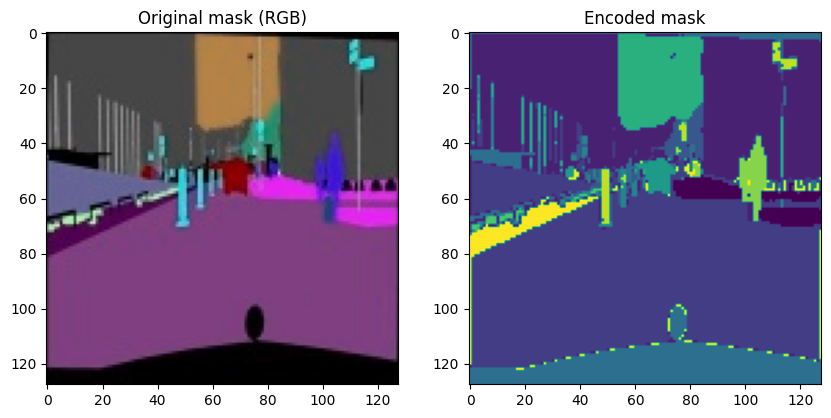

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


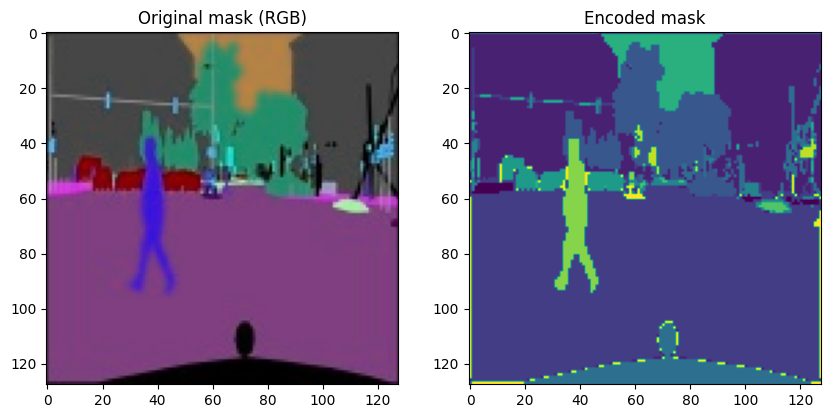

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


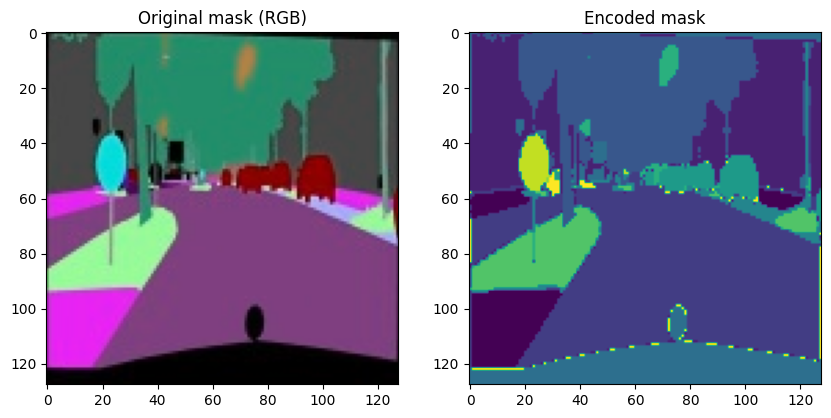

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


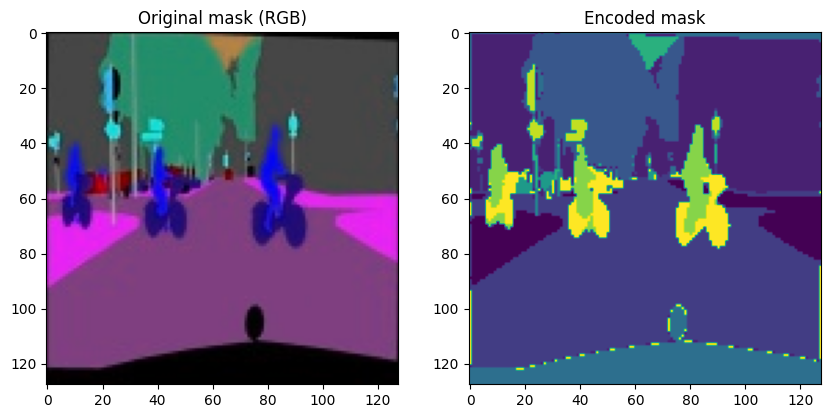

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


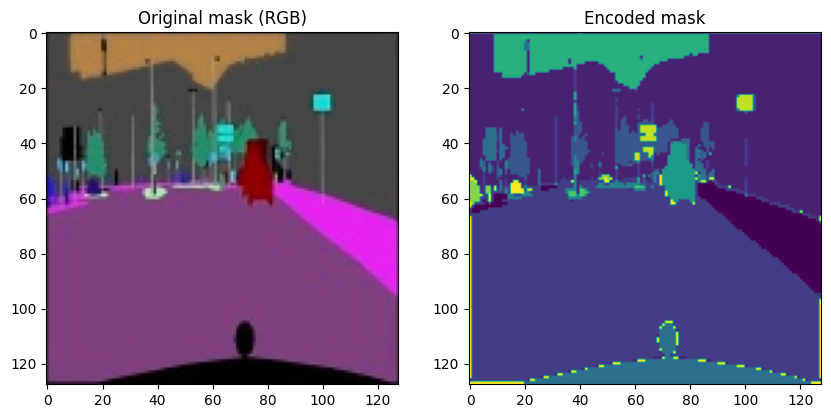

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


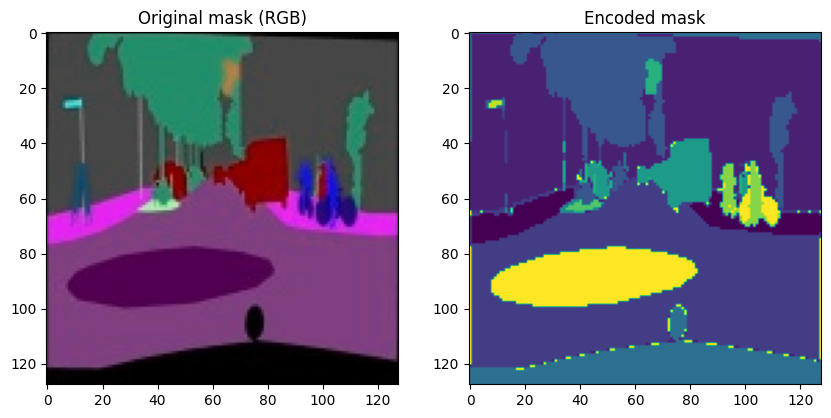

No of classes in encoded mask: [ 0  1  2  3  4  5  6  7  8  9 10 11]


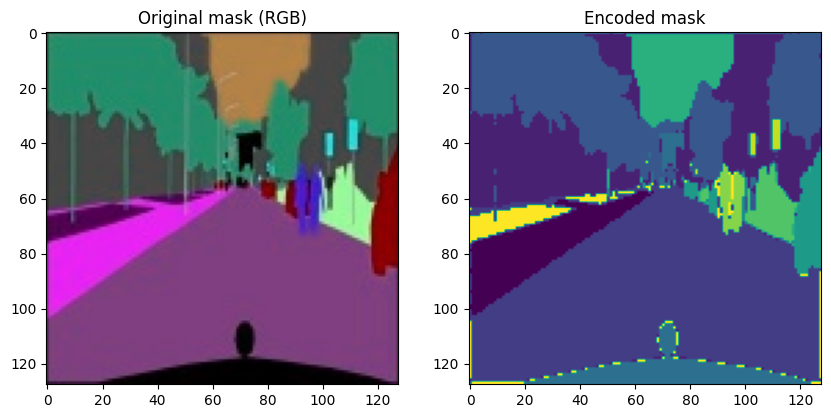

In [53]:
for i in train_files[300:310]:
    org_img = cv2.imread(i)
    #img = org_img[:, 0:256,:]
    msk = cv2.imread(i.replace("reduced","reduced_mask"))#org_img[:, 256:,:]      #shape (256,256,3)
    test = msk.reshape(-1,3)      #shape (65536,3)
    pred = encoder.predict(test)  #shape (65536)

    enc_pred = pred.reshape(INPUT_IMG_SIZE,INPUT_IMG_SIZE)  #shape (256,256)

    pred = np.array([colors[p] for p in pred]).reshape(INPUT_IMG_SIZE,INPUT_IMG_SIZE,3)

    print('No of classes in encoded mask:',np.unique(enc_pred))

    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(msk)
    plt.title('Original mask (RGB)')
    plt.subplot(1,2,2)
    plt.imshow(enc_pred)
    plt.title('Encoded mask')
    plt.show()

## Defining Dataset Objects

### Original Dataset

In [54]:
class Dataset(Dataset):
    def __init__(self, images_list,mask_list, size, augmentation = False, mean = None, std = None):
        self.images_list = images_list
        self.mask_list = mask_list
        self.size = size
        self.augmentation = augmentation
        if mean is None or std is None:
            self.mean = [0., 0., 0.]
            self.std = [1., 1., 1.]
        else:
            self.mean = mean
            self.std = std

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, index):
        pil_image = Image.open(self.images_list[index]).convert('RGB')
        pil_mask = Image.open(self.mask_list[index]).convert('RGB')



        np_image = np.array(pil_image)
        np_target = np.array(pil_mask)


        test = (np_target.reshape(-1,3))
        pred = encoder.predict(test)
        seg_msk = pred.reshape(self.size,self.size)
        angle=np.random.randint(25)
        if self.augmentation:
            trans_obj = A.Compose([A.Resize(self.size, self.size),
                           A.Rotate(angle, border_mode=4, p=0.5),

                           A.CoarseDropout(max_holes=30, max_height=int(self.size*0.015),
                                         max_width=int(self.size*0.015), fill_value=255, p=0.4),

                           A.Normalize(self.mean, self.std)
                          ])
        else:
            trans_obj = A.Compose([A.Resize(self.size, self.size),
                                   A.Normalize(self.mean, self.std)])

        transformed = trans_obj(image = np_image, mask = seg_msk)
        img_tensor = from_numpy(transformed['image']).permute(2, 0, 1)
        mask_tensor = from_numpy(transformed['mask'])
        return img_tensor, mask_tensor


In [55]:
train_data_obj = Dataset(train_files,train_files_mask, INPUT_IMG_SIZE, AUGMENTATION, mean=MEAN, std=STD)
val_data_obj = Dataset(test_files, test_files_mask, INPUT_IMG_SIZE, AUGMENTATION, mean=MEAN, std=STD)

In [56]:
train_data_rot = Dataset(train_files,train_files_mask, INPUT_IMG_SIZE, True, mean=MEAN, std=STD)
val_data_rot = Dataset(test_files, test_files_mask, INPUT_IMG_SIZE, True, mean=MEAN, std=STD)

In [57]:
print(train_data_obj.__len__())
print(val_data_obj.__len__())

2975
500


### Augmented Datasets

In [58]:
class Dataset_aug(Dataset):
    def __init__(self, images_list,mask_list, size, augmentation = False, mean = None, std = None):
        self.images_list = images_list
        self.mask_list = mask_list
        self.size = size
        self.augmentation = augmentation
        if mean is None or std is None:
            self.mean = [0., 0., 0.]
            self.std = [1., 1., 1.]
        else:
            self.mean = mean
            self.std = std

    def __len__(self):
        return len(self.images_list)

    def __getitem__(self, index):
        pil_image = Image.open(self.images_list[index]).convert('RGB')
        pil_mask = Image.open(self.mask_list[index]).convert('RGB')



        np_image = np.array(pil_image)
        np_target = np.array(pil_mask)


        test = (np_target.reshape(-1,3))
        pred = encoder.predict(test)
        seg_msk = pred.reshape(self.size,self.size)

        if self.augmentation:
            trans_obj = A.Compose([A.Resize(self.size, self.size),
                           A.Rotate(10, border_mode=4, p=0.5),
                           A.HorizontalFlip(p=0.3),
                           A.VerticalFlip(p=0.3),
                           A.OneOf([A.OpticalDistortion(),A.ElasticTransform()],  p=0.4),
                           A.CoarseDropout(max_holes=30, max_height=int(self.size*0.015),
                                         max_width=int(self.size*0.015), fill_value=255, p=0.4),
                           A.RandomBrightnessContrast(brightness_limit=0.3,p = 0.4),
                           A.RandomSnow(snow_point_lower=0.4,snow_point_upper=0.5,brightness_coeff=1.5,p = 0.4),
                           A.Normalize(self.mean, self.std)
                          ])
        else:
            trans_obj = A.Compose([A.Resize(self.size, self.size),
                                   A.Normalize(self.mean, self.std)])

        transformed = trans_obj(image = np_image, mask = seg_msk)
        img_tensor = from_numpy(transformed['image']).permute(2, 0, 1)
        mask_tensor = from_numpy(transformed['mask'])
        return img_tensor, mask_tensor


In [59]:
train_data_aug = Dataset_aug(train_files,train_files_mask, INPUT_IMG_SIZE, True, mean=MEAN, std=STD)
val_data_aug = Dataset_aug(test_files, test_files_mask, INPUT_IMG_SIZE, True, mean=MEAN, std=STD)

In [60]:
print(train_data_aug.__len__())
print(val_data_aug.__len__())

2975
500


### Downloading Data

In [219]:
import os

directory_path1 = './Noisy_Data'
directory_path2 = './Heavy_doped_data'
train_img = '/Train'
test_img = '/Test'
imagespt='/Images'
maskspt='/Masks'

In [211]:
os.makedirs(directory_path1+test_img+maskspt, exist_ok=True)
os.makedirs(directory_path1+test_img+imagespt, exist_ok=True)
os.makedirs(directory_path1+train_img+maskspt, exist_ok=True)
os.makedirs(directory_path1+train_img+imagespt, exist_ok=True)


In [220]:
os.makedirs(directory_path2+test_img+maskspt, exist_ok=True)
os.makedirs(directory_path2+test_img+imagespt, exist_ok=True)
os.makedirs(directory_path2+train_img+maskspt, exist_ok=True)
os.makedirs(directory_path2+train_img+imagespt, exist_ok=True)

In [216]:
def exp(dataset,path):
  for i in range(dataset.__len__()):
    img,  msk = dataset.__getitem__(i)
    img=img.permute(1,2,0)
    img=img.numpy()*255
    img=cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(path+"Image_"+str(i)+".jpg", img)



In [229]:
def expm(dataset,path):
  for i in range(dataset.__len__()):
    img,  msk = dataset.__getitem__(i)
    msk=msk.numpy()*255
    plt.imsave(path+"Mask_"+str(i)+".jpg", msk)

In [249]:
# These functions were run only to save dataset, no need to run them again

### Visualizing

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


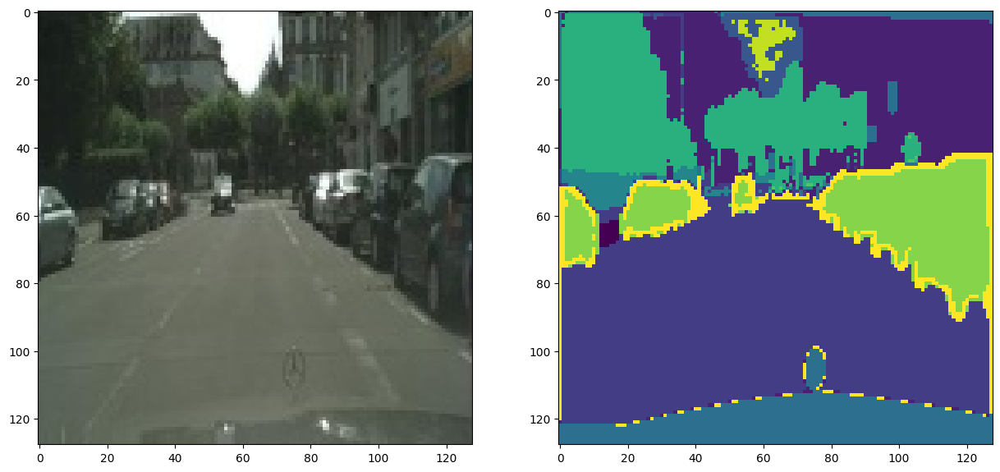

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0275)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


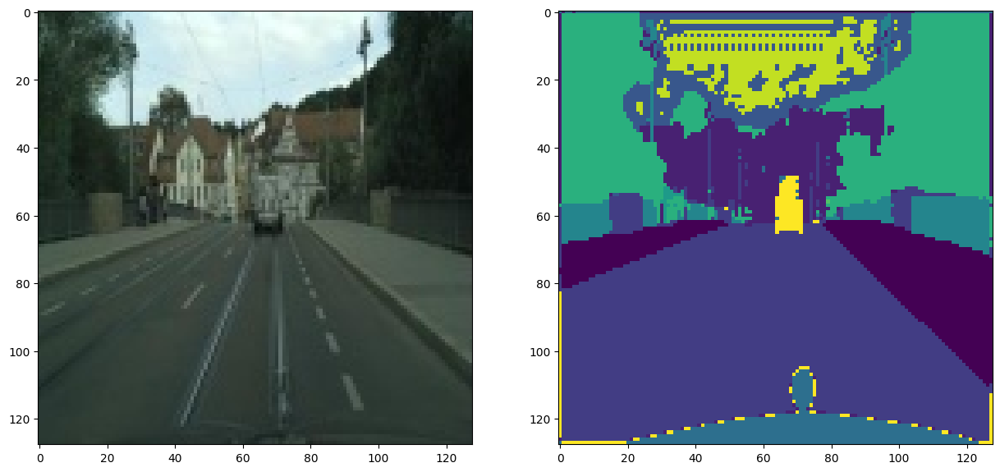

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0118)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


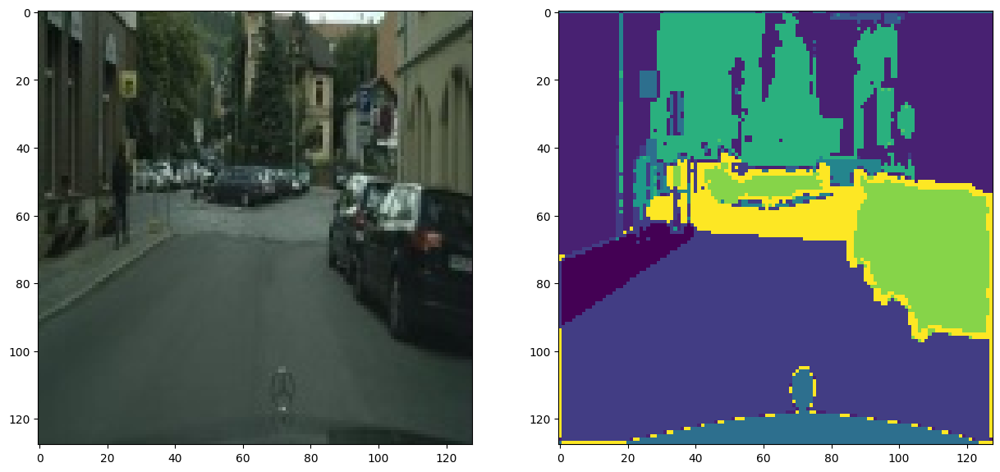

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0275)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


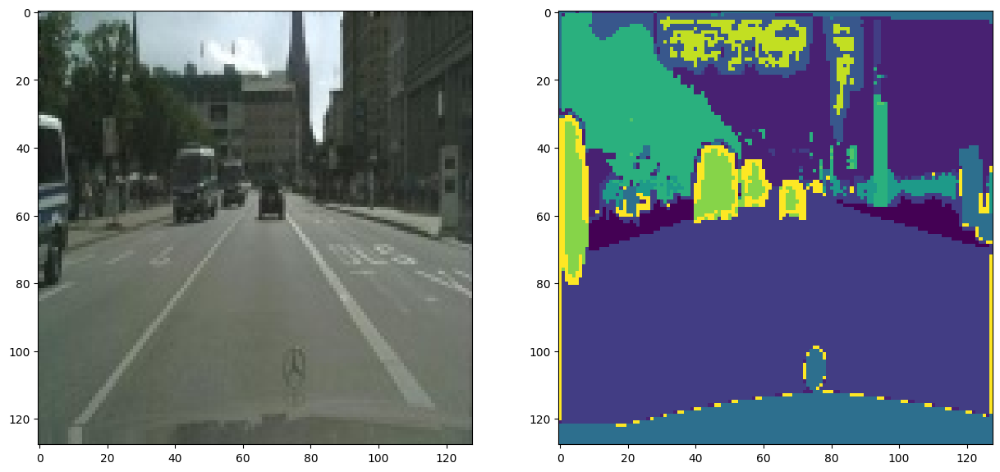

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


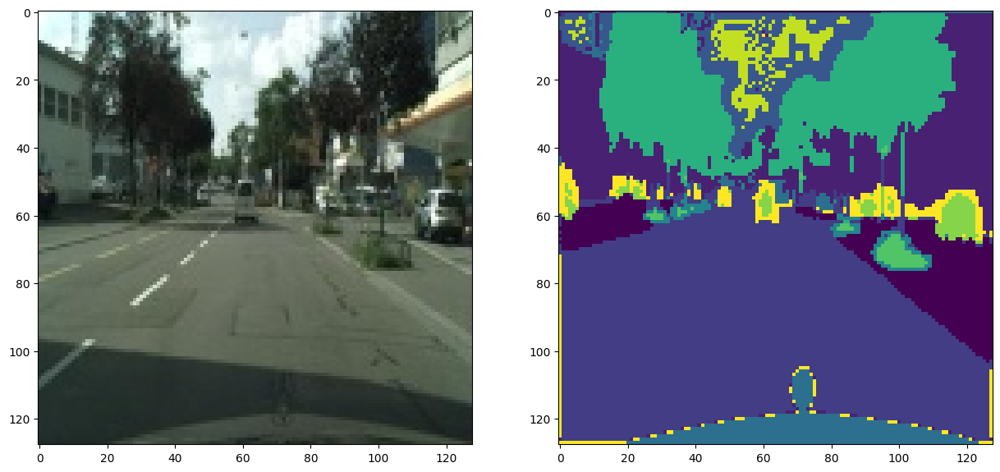

In [61]:
for i in range(5):
    img,  msk = train_data_obj.__getitem__(i)
    print(img.shape, msk.shape)
    print(img.max(), img.min())
    print(msk.max(), msk.min())
    plt.figure(figsize=(15,10))
    plt.subplot(1,2,1)
    plt.imshow(img.permute(1,2,0))
    plt.subplot(1,2,2)
    plt.imshow(msk)
    plt.show()

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0510)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


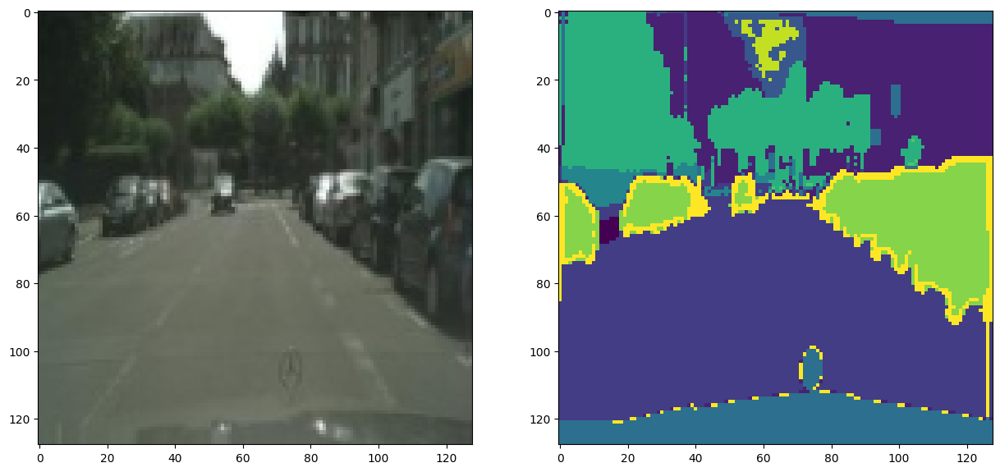

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0275)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


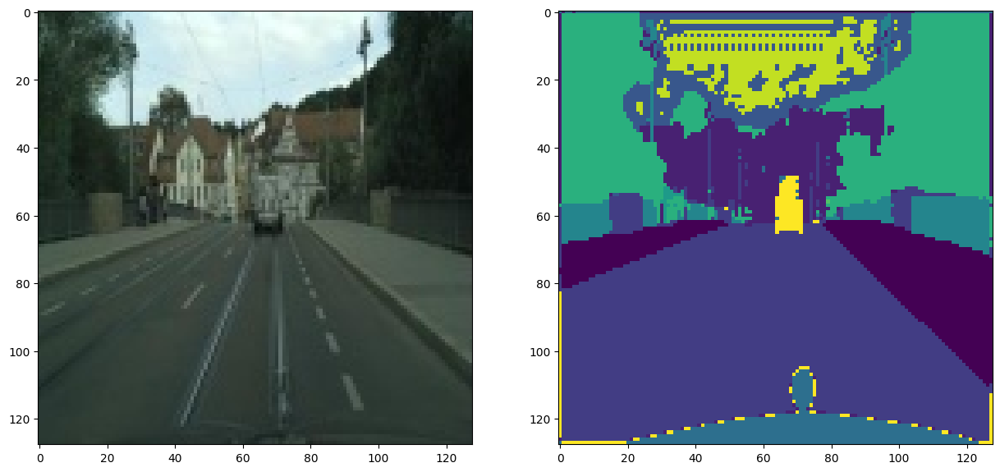

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0118)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


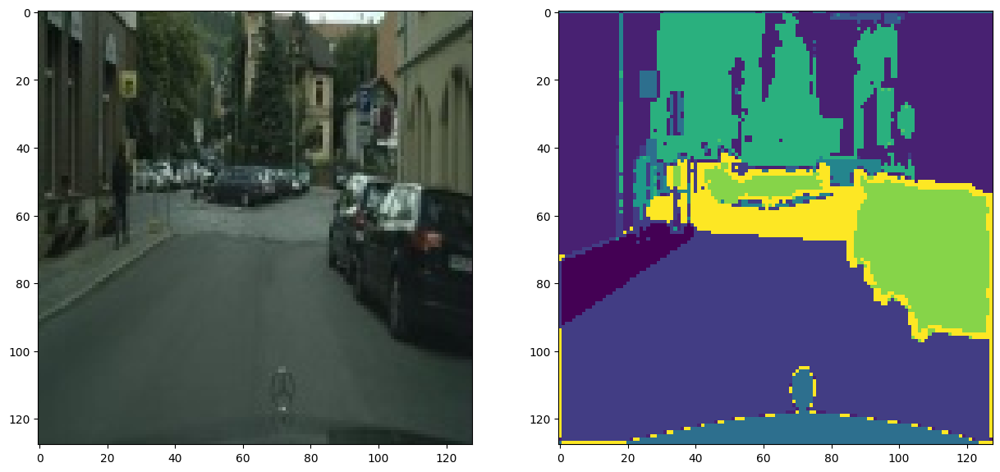

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0824)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


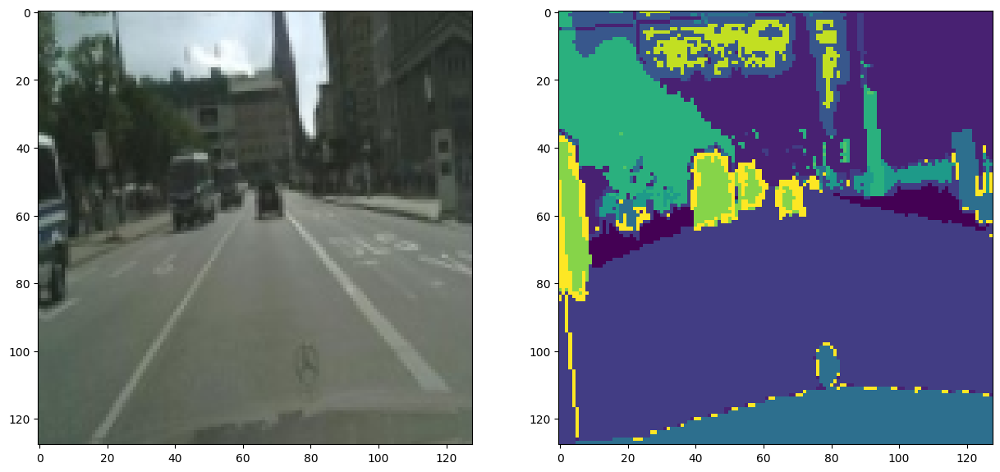

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


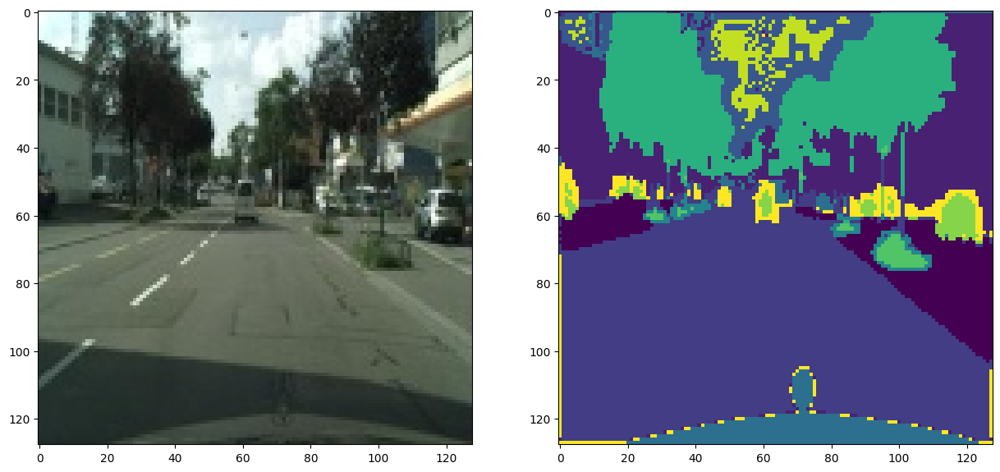

In [62]:
for i in range(5):
    img,  msk = train_data_rot.__getitem__(i)
    print(img.shape, msk.shape)
    print(img.max(), img.min())
    print(msk.max(), msk.min())
    plt.figure(figsize=(15,10))
    plt.subplot(1,2,1)
    plt.imshow(img.permute(1,2,0))
    plt.subplot(1,2,2)
    plt.imshow(msk)
    plt.show()

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


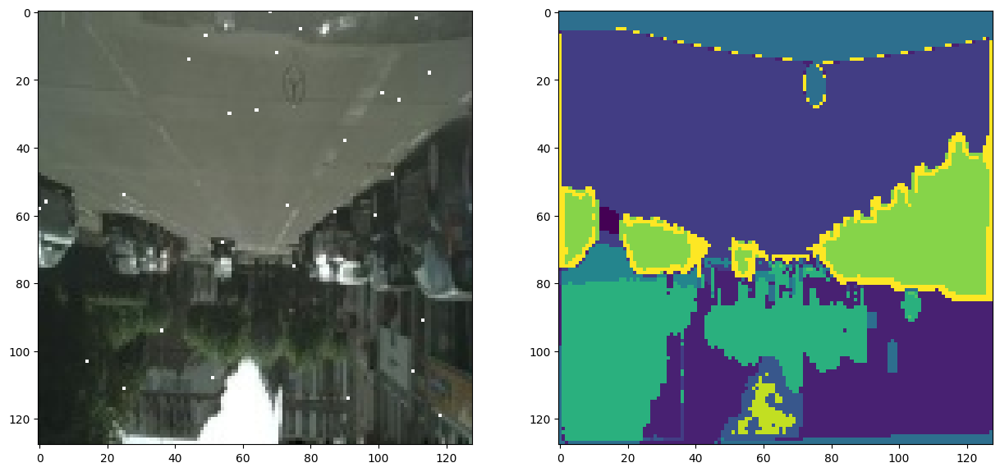

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0314)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


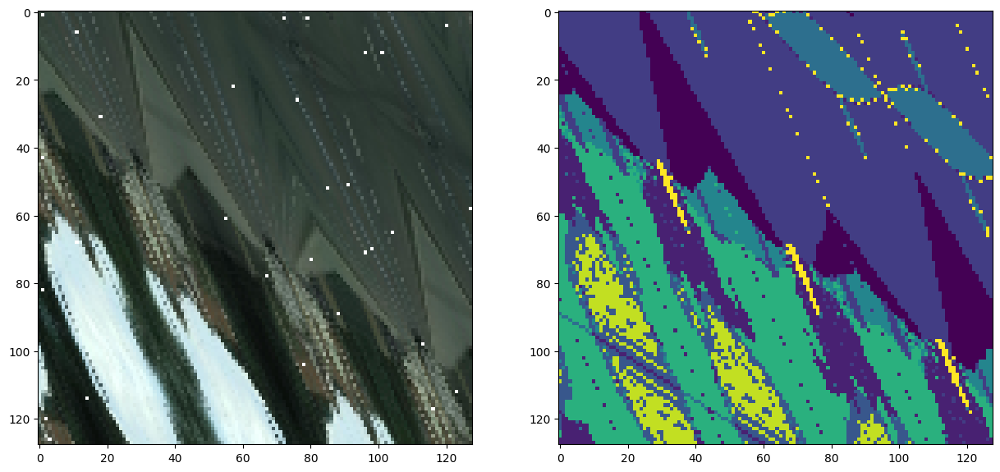

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.1843)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


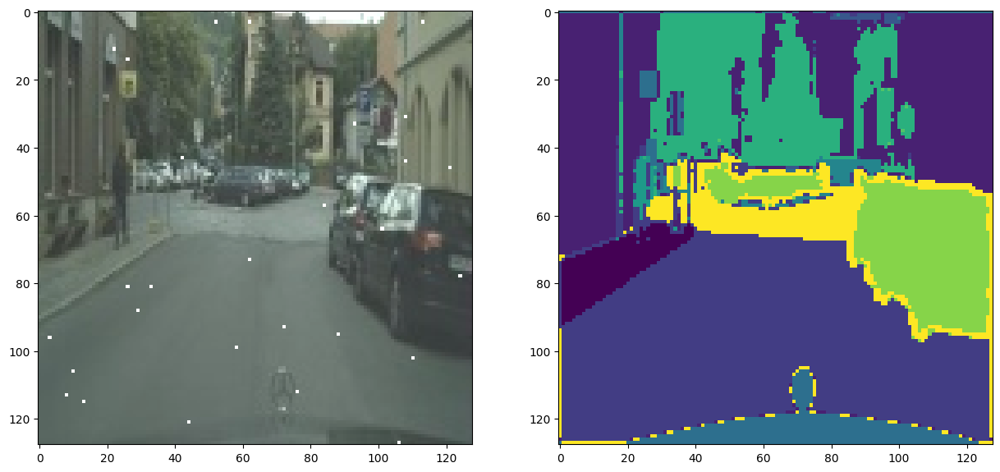

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.0588)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


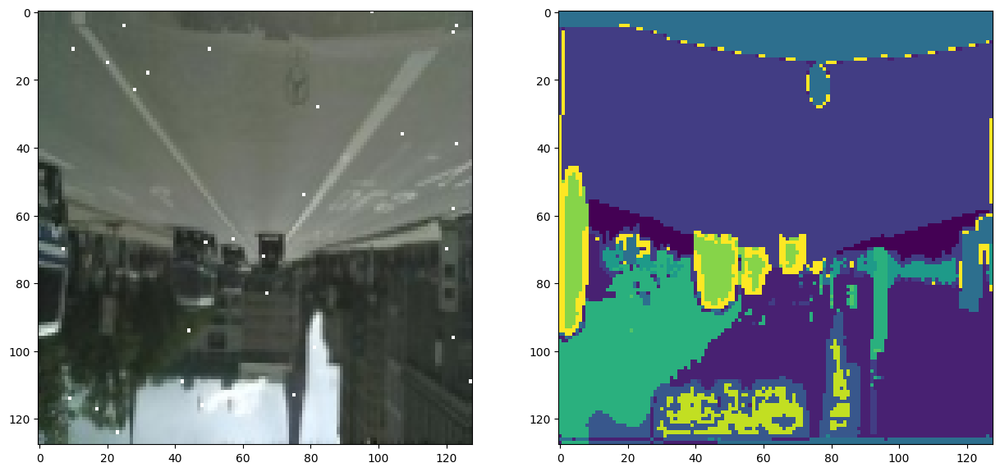

torch.Size([3, 128, 128]) torch.Size([128, 128])
tensor(1.) tensor(0.)
tensor(11, dtype=torch.int32) tensor(0, dtype=torch.int32)


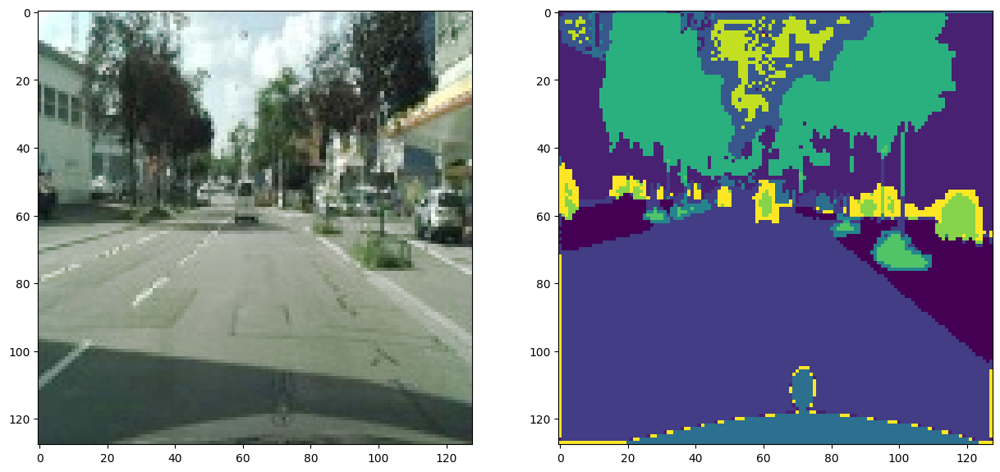

In [63]:
for i in range(5):
    img,  msk = train_data_aug.__getitem__(i)
    print(img.shape, msk.shape)
    print(img.max(), img.min())
    print(msk.max(), msk.min())
    plt.figure(figsize=(15,10))
    plt.subplot(1,2,1)
    plt.imshow(img.permute(1,2,0))
    plt.subplot(1,2,2)
    plt.imshow(msk)
    plt.show()

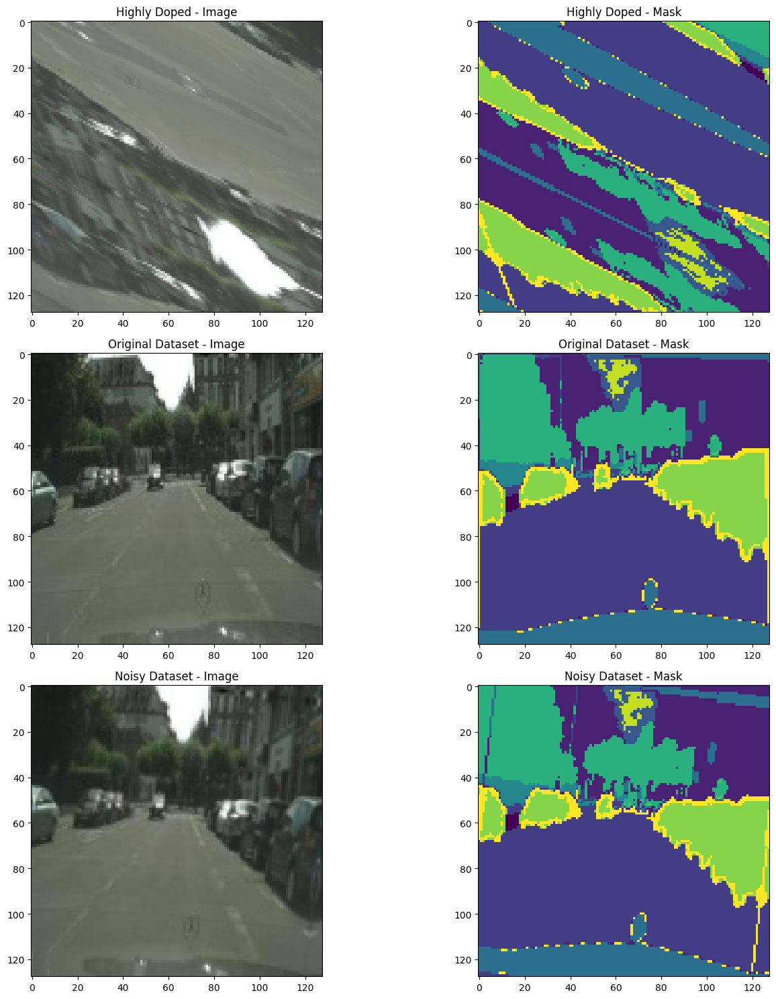

In [78]:
x=0
img,  msk = train_data_aug.__getitem__(x)

img_obj, msk_obj = train_data_obj.__getitem__(x)

img_rot, msk_rot = train_data_rot.__getitem__(x)

plt.figure(figsize=(15, 15))

plt.subplot(3, 2, 1)
plt.imshow(img.permute(1, 2, 0))
plt.title("Highly Doped - Image")
plt.subplot(3, 2, 2)
plt.imshow(msk)
plt.title("Highly Doped - Mask")

plt.subplot(3, 2, 3)
plt.imshow(img_obj.permute(1, 2, 0))
plt.title("Original Dataset - Image")
plt.subplot(3, 2, 4)
plt.imshow(msk_obj)
plt.title("Original Dataset - Mask")

plt.subplot(3, 2, 5)
plt.imshow(img_rot.permute(1, 2, 0))
plt.title("Noisy Dataset - Image")
plt.subplot(3, 2, 6)
plt.imshow(msk_rot)
plt.title("Noisy Dataset - Mask")

plt.tight_layout()
plt.show()

## Initializing Model

### Trainer

In [65]:
class Trainer:
    def __init__(self,
                 model,
                 crit,
                 train_data = None,
                 val_data = None,
                 initialize_from_ckp = None,
                 opti_name = None,
                 scheduler_name = None,
                 input_img_size = None,
                 batch_size = None,
                 out_classes = None,
                 use_cuda = False,
                 max_epochs = None,
                 learning_rate = None,
                 thresh_acc = None,
                 experiment_name = None,
                 step_size = None
                 ):
        self.model = model
        self.crit = crit
        self.train_data = train_data
        self.val_data = val_data
        self.opti_name = opti_name
        self.scheduler_name = scheduler_name
        self.input_img_size = input_img_size
        self.batch_size = batch_size
        self.out_classes = out_classes
        self.cuda = use_cuda
        self.max_epochs = max_epochs
        self.learning_rate = learning_rate
        self.thresh_acc_ckp = thresh_acc
        self.step_size = step_size

        if use_cuda:
            self.model = model.cuda()
            self.crit = crit.cuda()
            self.model = DataParallel(model)

        self.optim = self.select_optimizer()
        self.scheduler = self.select_scheduler()
        self.train_dl = self.data_loader(self.train_data)
        self.val_test_dl = self.data_loader(self.val_data)
        self.nowtime = datetime.datetime.now().strftime('%d-%m-%Y [%H.%M.%S]')

        if initialize_from_ckp is not None:
            self.restore_checkpoint(initialize_from_ckp)

    def data_loader(self, data_object):
        return DataLoader(data_object, batch_size = self.batch_size, shuffle=True)

    def select_optimizer(self):
        if self.opti_name == 'Adam':
            return Adam(self.model.parameters(), lr=self.learning_rate)
        if self.opti_name == 'SGD':
            return SGD(self.model.parameters(), lr=self.learning_rate, momentum=0.9)

    def select_scheduler(self):
        if self.scheduler_name == 'stepLR':
            return lr_scheduler.StepLR(optimizer=self.optim, step_size = self.step_size, gamma=0.1)
        if self.scheduler_name == 'ReduceLROnPlateau':
            return lr_scheduler.ReduceLROnPlateau(optimizer = self.optim, mode='max', factor=0.2)

    def restore_checkpoint(self, checkpoint):
        cuda_device = torch.device('cuda' if self.cuda else 'cpu')
        ckp = torch.load(checkpoint, map_location = cuda_device)
        self.model.load_state_dict(ckp)
        for param in self.model.features.parameters():
            param.requires_grad = False
        # self._optim.load_state_dict(ckp)

    def save_checkpoint(self, folder_name):
        torch.save({'state_dict': self.model.state_dict(),
                'optimizer_state_dict': self.optim.state_dict(),
                }, folder_name + '/checkpoint.ckp')

    def IoU(self, label, pred, num_classes=12):
        label = label.detach().cpu()
        pred = pred.detach().cpu()
        pred = F.softmax(pred, dim=1)
        pred = torch.argmax(pred, dim=1).squeeze(1)
        iou_list = list()
        present_iou_list = list()

        pred = pred.view(-1)
        label = label.view(-1)

        for sem_class in range(num_classes):
            pred_inds = (pred == sem_class)
            target_inds = (label == sem_class)
            if target_inds.long().sum().item() == 0:
                iou_now = float('nan')
            else:
                intersection_now = (pred_inds[target_inds]).long().sum().item()
                union_now = pred_inds.long().sum().item() + target_inds.long().sum().item() - intersection_now
                iou_now = float(intersection_now) / float(union_now)
                present_iou_list.append(iou_now)
            iou_list.append(iou_now)
        return np.mean(present_iou_list)

    def train_epoch(self):
        device = torch.device('cuda' if self.cuda else 'cpu')
        self.model.train()
        loss_list = []
        acc_list = []

        for i, (images, labels) in enumerate(self.train_dl):
            batchsize = images.shape[0]
            images = images.to(device, dtype=torch.float32)
            labels = labels.to(device, dtype=torch.float32)
            self.optim.zero_grad()
            preds = self.model(images)
            loss = self.crit(preds, labels.long())
            accuracy = self.IoU(labels, preds)
            #print(accuracy)
            loss.backward()
            self.optim.step()
            lossitem = loss.item()
            del loss
            loss_list.append(lossitem)
            acc_list.append(accuracy)

        loss_avg = np.mean(loss_list)
        acc_avg = np.mean(acc_list)
        return loss_avg, acc_avg

    def val_epoch(self, current_epoch):
        device = torch.device('cuda' if self.cuda else 'cpu')
        self.model.eval()
        loss_list = []
        acc_list = []
        with torch.no_grad():
            for i, (images, labels) in enumerate(self.val_test_dl):
                im, lb = images, labels
                batchsize = images.shape[0]
                images = images.to(device, dtype=torch.float32)
                labels = labels.to(device, dtype=torch.float32)
                preds = self.model(images)
                loss = self.crit(preds, labels.long())
                lossitem = loss.item()
                del loss

                accuracy = self.IoU(labels, preds)
                loss_list.append(lossitem)
                acc_list.append(accuracy)
                if i == 2:
                    print('-'*20)
                    print('Validation results after {} epochs:'.format(current_epoch))
                    plt.figure(figsize=(20,15))
                    plt.subplot(1,3,1)
                    plt.imshow(im[0].permute(1,2,0))
                    plt.title('image')
                    plt.subplot(1,3,2)
                    plt.imshow(lb[0])
                    plt.title('mask')
                    plt.subplot(1,3,3)
                    p = preds[0].permute(1,2,0)
                    p = torch.argmax(p, dim=2)
                    plt.imshow(p.cpu())
                    plt.title('prediction')
                    plt.show()
            loss_avg = np.mean(loss_list)
            acc_avg = np.mean(acc_list)
        return loss_avg, acc_avg

    def print_train_logs(self, results):
        epoch_counter, train_loss, train_accuracy, val_loss, val_accuracy = results
        print('[Epochs-{}/{}]:'. format(epoch_counter, self.max_epochs))
        print('[Train_loss:{:0.4f} | Train_acc:{:0.4f} | Val_loss:{:0.4f} | Val_acc:{:0.4f}]'
                  .format(train_loss, train_accuracy, val_loss, val_accuracy))

    def plot_logs(self, results):
        epoch_counter, train_loss, train_accuracy, val_loss, val_accuracy = results


        plt.figure(figsize=(15, 5))

        plt.subplot(1, 2, 1)
        plt.plot(epoch_counter, train_accuracy, label='Train Accuracy', color='blue')
        plt.plot(epoch_counter, val_accuracy, label='Validation Accuracy', color='red')
        plt.title('Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()


        plt.subplot(1, 2, 2)
        plt.plot(epoch_counter, train_loss, label='Train Loss', color='green')
        plt.plot(epoch_counter, val_loss, label='Validation Loss', color='orange')
        plt.title('Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        plt.show()

    def train(self):

        model_path = 'results/%s' % (self.nowtime)
        epoch_counter_list = []
        train_loss_list = []
        train_accuracy_list = []
        val_loss_list = []
        val_accuracy_list = []

        for epoch_counter in tqdm.tqdm(range(1, self.max_epochs+1)):
            train_loss, train_accuracy = self.train_epoch()
            val_loss, val_accuracy= self.val_epoch(epoch_counter)
            epoch_counter_list.append(epoch_counter)
            train_loss_list.append(train_loss)
            train_accuracy_list.append(train_accuracy)
            val_loss_list.append(val_loss)
            val_accuracy_list.append(val_accuracy)
            epoch_results = [epoch_counter, train_loss, train_accuracy, val_loss, val_accuracy]
            self.print_train_logs(epoch_results)

            if val_accuracy > self.thresh_acc_ckp and val_accuracy == max(val_accuracy_list):
                new_ckp = '/epoch_{}_val_acc [{:0.3f}]' . format(epoch_counter, val_accuracy)
                temp_path = model_path + new_ckp
                os.makedirs(temp_path, exist_ok=True)
                if os.path.exists(temp_path):
                    self.save_checkpoint(temp_path)

            if self.scheduler:
                self.scheduler.step()
        train_results = [epoch_counter_list, train_loss_list, train_accuracy_list, val_loss_list, val_accuracy_list]
        self.plot_logs(train_results)
        return train_results

### Architecture

In [66]:
class Net(nn.Module):
    def __init__(self, num_classes):
        super(Net, self).__init__()
        self.num_classes = num_classes
        self.contracting_11 = self.conv_block(in_channels=3, out_channels=64)
        self.contracting_12 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_21 = self.conv_block(in_channels=64, out_channels=128)
        self.contracting_22 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.contracting_31 = self.conv_block(in_channels=128, out_channels=256)
        self.contracting_32 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.middle = self.conv_block(in_channels=256, out_channels=1024)
        self.expansive_11 = nn.ConvTranspose2d(in_channels=1024, out_channels=256, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_12 = self.conv_block(in_channels=512, out_channels=256)
        self.expansive_21 = nn.ConvTranspose2d(in_channels=256, out_channels=128, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_22 = self.conv_block(in_channels=256, out_channels=128)
        self.expansive_31 = nn.ConvTranspose2d(in_channels=128, out_channels=64, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.expansive_32 = self.conv_block(in_channels=128, out_channels=64)
        self.output = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=3, stride=1, padding=1)




    def conv_block(self, in_channels, out_channels):
        block = nn.Sequential(nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels),
                                    nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1),
                                    nn.ReLU(),
                                    nn.BatchNorm2d(num_features=out_channels))
        return block

    def forward(self, X):

        contracting_11_out = self.contracting_11(X)

        contracting_12_out = self.contracting_12(contracting_11_out)

        contracting_21_out = self.contracting_21(contracting_12_out)

        contracting_22_out = self.contracting_22(contracting_21_out)

        contracting_31_out = self.contracting_31(contracting_22_out)

        contracting_32_out = self.contracting_32(contracting_31_out)

        middle_out = self.middle(contracting_32_out)

        expansive_11_out = self.expansive_11(middle_out)

        expansive_12_out = self.expansive_12(torch.cat((expansive_11_out, contracting_31_out), dim=1))

        expansive_21_out = self.expansive_21(expansive_12_out)

        expansive_22_out = self.expansive_22(torch.cat((expansive_21_out, contracting_21_out), dim=1))

        expansive_31_out = self.expansive_31(expansive_22_out)

        expansive_32_out = self.expansive_32(torch.cat((expansive_31_out, contracting_11_out), dim=1))

        output_out = self.output(expansive_32_out)
        return output_out

In [67]:
nt = Net(12)

In [68]:
nt(torch.zeros(2,3,128,128)).shape

torch.Size([2, 12, 128, 128])

In [69]:
print(nt)

Net(
  (contracting_11): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contracting_12): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (contracting_21): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (contracting_22): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (contra

## Training and Testing Models

### Original model --> Original Dataset

In [134]:
unet = Net(num_classes=OUTPUT_CLASSES)

In [135]:
model = unet
loss_function = nn.CrossEntropyLoss()

In [136]:
trainer =  Trainer(model = model,
                  crit = loss_function,
                  train_data = train_data_obj,
                  val_data = val_data_obj,
                  initialize_from_ckp = None,
                  opti_name = OPIMIZER_NAME,
                  scheduler_name = SCHEDULER_NAME,
                  input_img_size = INPUT_IMG_SIZE,
                  batch_size = BATCH_SIZE,
                  out_classes = OUTPUT_CLASSES,
                  use_cuda = USE_CUDA,
                  max_epochs = MAX_EPOCHS,

                  learning_rate = LEARINING_RATE,
                  thresh_acc = THRESH_ACC_CKP,
                  step_size = SCHEDULER_STEP_SIZE
                 )

  0%|          | 0/10 [00:00<?, ?it/s]

--------------------
Validation results after 1 epochs:


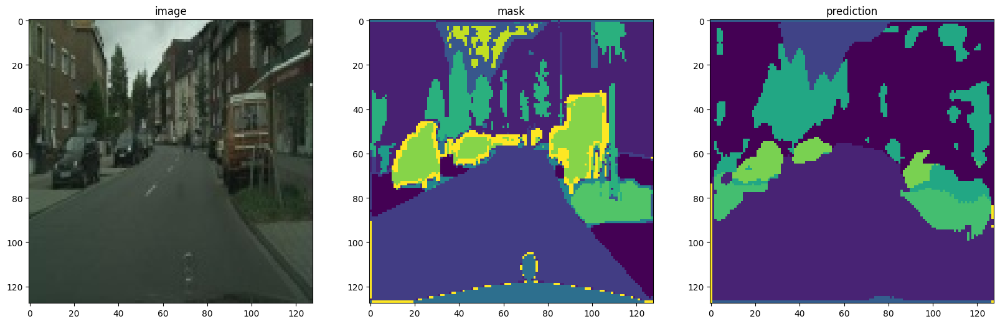

 10%|█         | 1/10 [01:16<11:29, 76.57s/it]

[Epochs-1/10]:
[Train_loss:1.1520 | Train_acc:0.2531 | Val_loss:1.1155 | Val_acc:0.2435]
--------------------
Validation results after 2 epochs:


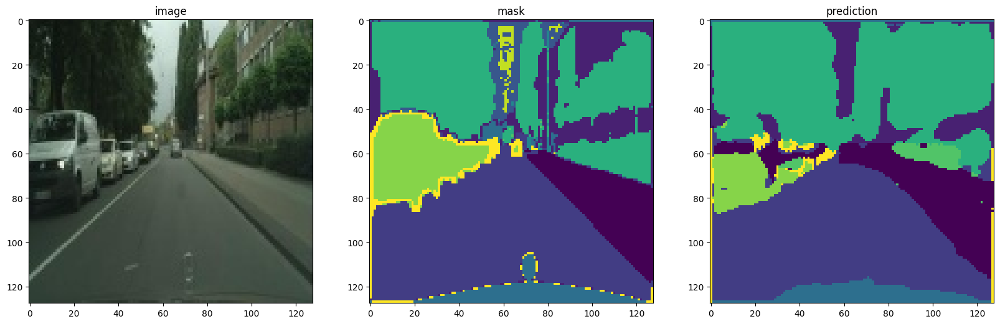

 20%|██        | 2/10 [02:33<10:13, 76.67s/it]

[Epochs-2/10]:
[Train_loss:0.8836 | Train_acc:0.3491 | Val_loss:0.9910 | Val_acc:0.2922]
--------------------
Validation results after 3 epochs:


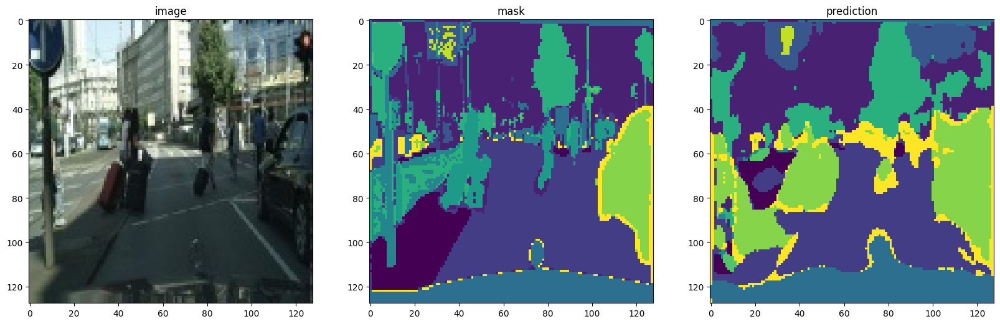

 30%|███       | 3/10 [03:50<08:57, 76.77s/it]

[Epochs-3/10]:
[Train_loss:0.7788 | Train_acc:0.4024 | Val_loss:0.8110 | Val_acc:0.3885]
--------------------
Validation results after 4 epochs:


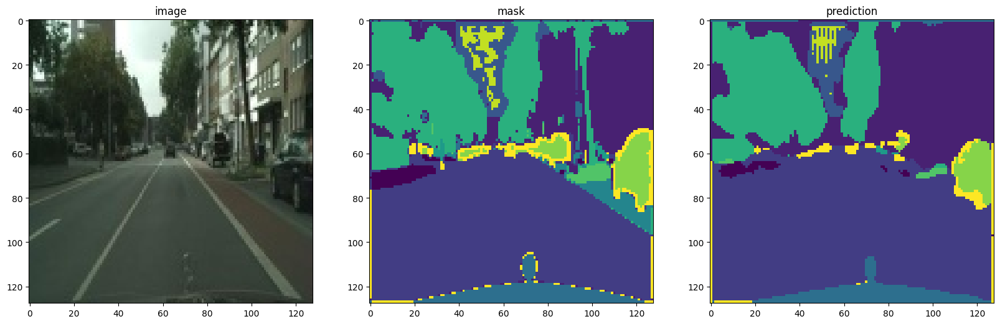

 40%|████      | 4/10 [05:07<07:41, 76.85s/it]

[Epochs-4/10]:
[Train_loss:0.7141 | Train_acc:0.4342 | Val_loss:0.7742 | Val_acc:0.3666]
--------------------
Validation results after 5 epochs:


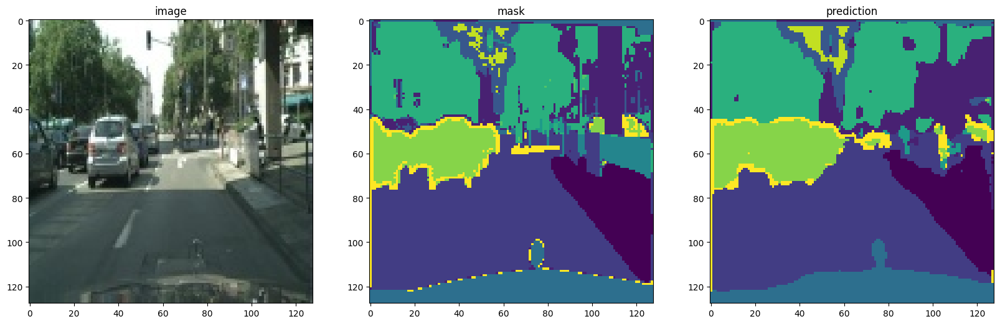

 50%|█████     | 5/10 [06:23<06:23, 76.75s/it]

[Epochs-5/10]:
[Train_loss:0.6203 | Train_acc:0.4802 | Val_loss:0.6176 | Val_acc:0.4718]
--------------------
Validation results after 6 epochs:


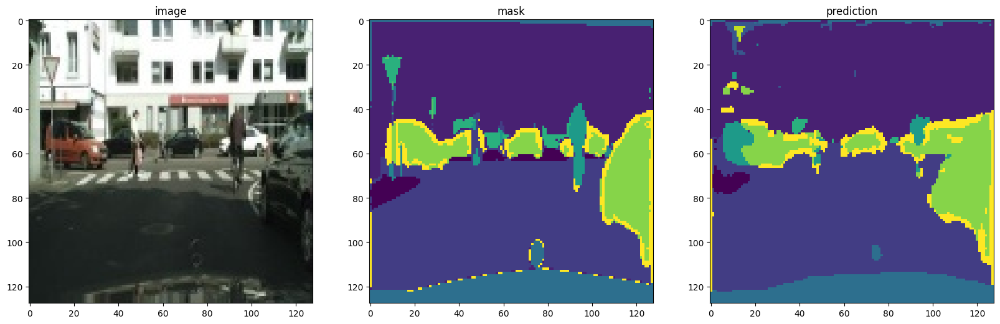

 60%|██████    | 6/10 [07:40<05:06, 76.73s/it]

[Epochs-6/10]:
[Train_loss:0.6026 | Train_acc:0.4894 | Val_loss:0.6246 | Val_acc:0.4670]
--------------------
Validation results after 7 epochs:


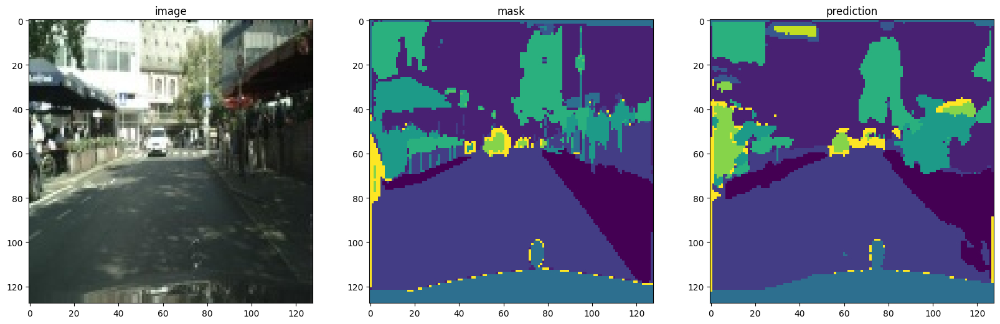

 70%|███████   | 7/10 [08:57<03:50, 76.72s/it]

[Epochs-7/10]:
[Train_loss:0.5880 | Train_acc:0.4976 | Val_loss:0.5967 | Val_acc:0.4846]
--------------------
Validation results after 8 epochs:


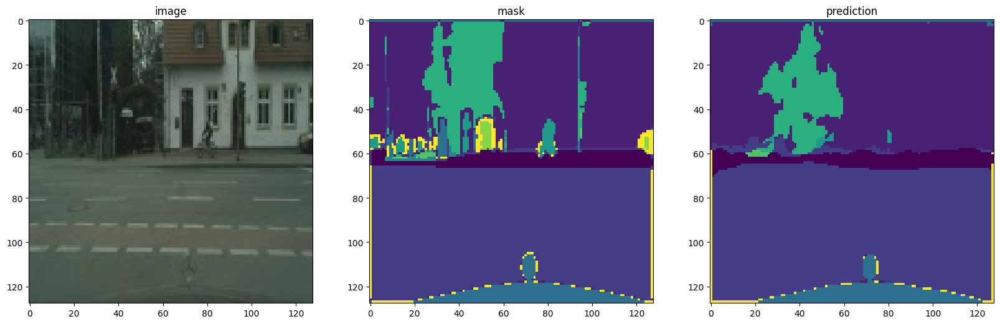

 80%|████████  | 8/10 [10:13<02:33, 76.61s/it]

[Epochs-8/10]:
[Train_loss:0.5764 | Train_acc:0.5052 | Val_loss:0.5887 | Val_acc:0.4878]
--------------------
Validation results after 9 epochs:


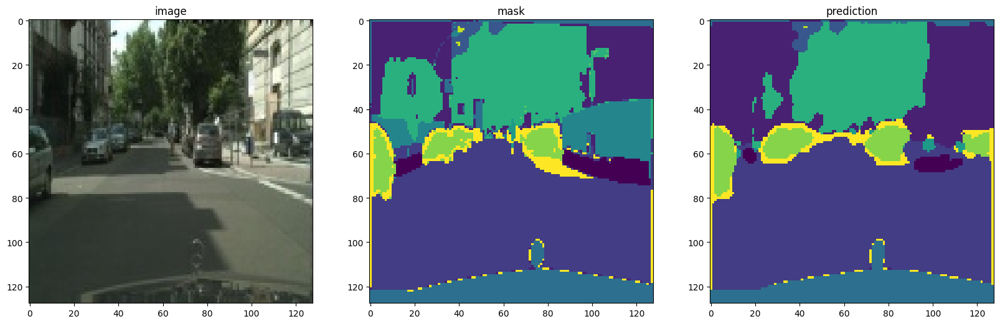

 90%|█████████ | 9/10 [11:29<01:16, 76.46s/it]

[Epochs-9/10]:
[Train_loss:0.5602 | Train_acc:0.5128 | Val_loss:0.5808 | Val_acc:0.4902]
--------------------
Validation results after 10 epochs:


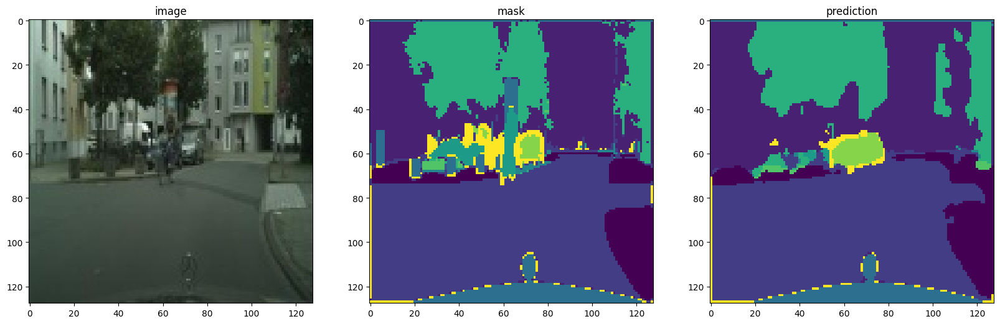

100%|██████████| 10/10 [12:50<00:00, 77.06s/it]

[Epochs-10/10]:
[Train_loss:0.5528 | Train_acc:0.5163 | Val_loss:0.5780 | Val_acc:0.4922]


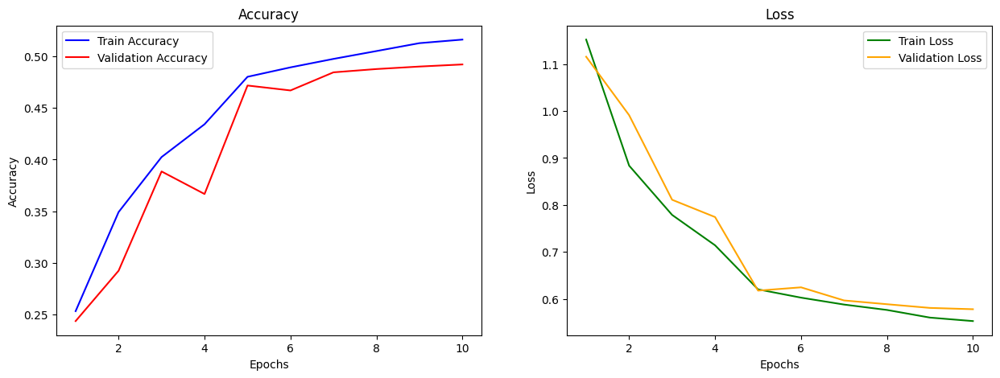

In [137]:
base=trainer.train()

In [138]:
torch.save(model.state_dict(), 'model_org.pth')
torch.save(model.state_dict(), 'model_org.pt')

In [139]:
import pickle
pickle.dump(model, open('model_org_pkl.sav', 'wb'))

In [140]:
base

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [1.151974075423774,
  0.8836486031932216,
  0.778752677863644,
  0.71406293972846,
  0.6202591450143886,
  0.6026432999680119,
  0.5879562426638859,
  0.5764325066439567,
  0.5601883501775803,
  0.5527730272502027],
 [0.25306841315402695,
  0.3491138870564776,
  0.4024367203182509,
  0.43424378667221203,
  0.48022885910069474,
  0.48938179738197973,
  0.4975811336857634,
  0.505182479229439,
  0.5128498866750764,
  0.5163023655239265],
 [1.115522731864263,
  0.9910273930383107,
  0.8110038638114929,
  0.7741839261282057,
  0.6176231489295051,
  0.6246098530670953,
  0.5967143064453488,
  0.588667706364677,
  0.58079856113782,
  0.5780103168790303],
 [0.24345051260137832,
  0.2922417421767326,
  0.3884854340747479,
  0.3666158812114697,
  0.4717846891977248,
  0.46700489865581524,
  0.4845669952069775,
  0.4877504989724895,
  0.49017369292368096,
  0.4922101347267245]]

### Original model --> Low noise Dataset

In [90]:
unet_rot = Net(num_classes=OUTPUT_CLASSES)

In [91]:
model1 = unet_rot
loss_function = nn.CrossEntropyLoss()

In [92]:
trainer =  Trainer(model = model1,
                  crit = loss_function,
                  train_data = train_data_obj,
                  val_data = val_data_rot,
                  initialize_from_ckp = None,
                  opti_name = OPIMIZER_NAME,
                  scheduler_name = SCHEDULER_NAME,
                  input_img_size = INPUT_IMG_SIZE,
                  batch_size = BATCH_SIZE,
                  out_classes = OUTPUT_CLASSES,
                  use_cuda = USE_CUDA,
                  max_epochs = MAX_EPOCHS,
                  learning_rate = 0.001,
                  thresh_acc = THRESH_ACC_CKP,
                  step_size = SCHEDULER_STEP_SIZE
                 )

  0%|          | 0/10 [00:00<?, ?it/s]

--------------------
Validation results after 1 epochs:


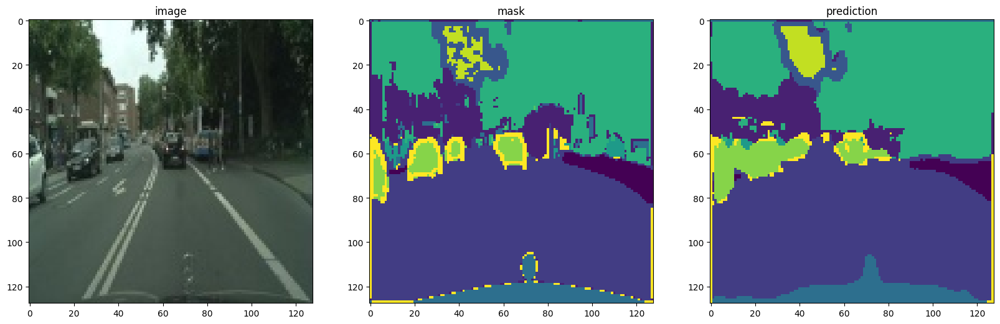

 10%|█         | 1/10 [01:18<11:43, 78.20s/it]

[Epochs-1/10]:
[Train_loss:0.9389 | Train_acc:0.3396 | Val_loss:0.9878 | Val_acc:0.3351]
--------------------
Validation results after 2 epochs:


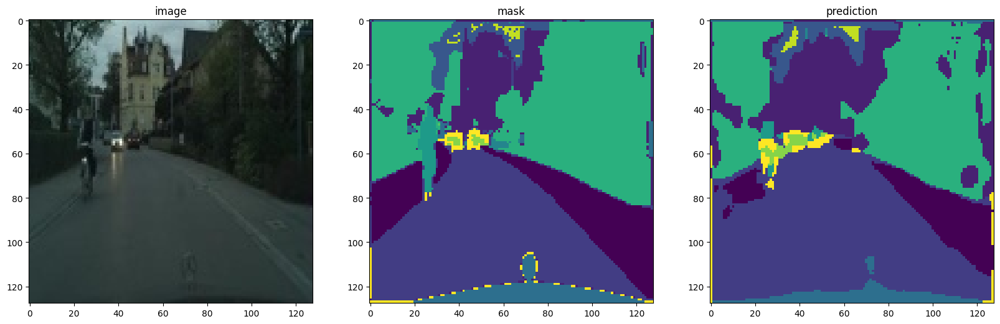

 20%|██        | 2/10 [02:35<10:21, 77.72s/it]

[Epochs-2/10]:
[Train_loss:0.7499 | Train_acc:0.4168 | Val_loss:0.8405 | Val_acc:0.3851]
--------------------
Validation results after 3 epochs:


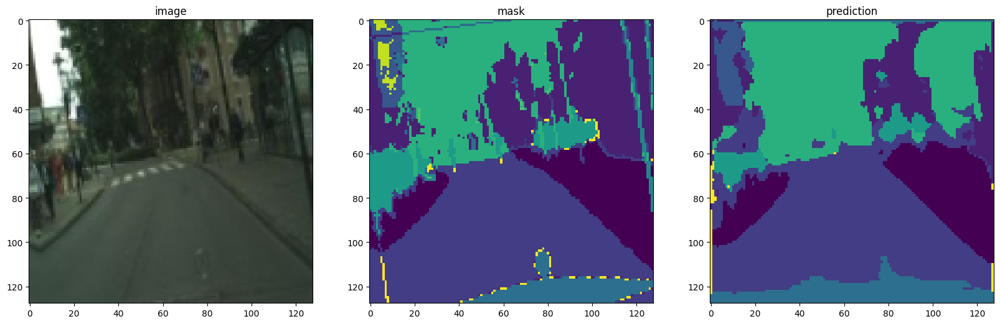

 30%|███       | 3/10 [03:52<09:01, 77.39s/it]

[Epochs-3/10]:
[Train_loss:0.6707 | Train_acc:0.4553 | Val_loss:0.8231 | Val_acc:0.3976]
--------------------
Validation results after 4 epochs:


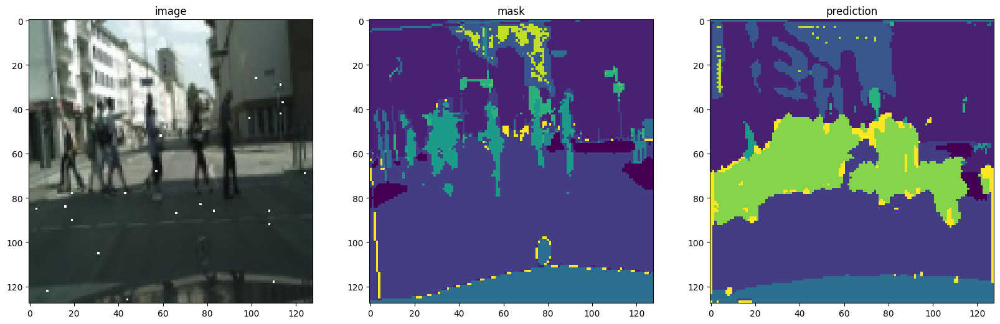

 40%|████      | 4/10 [05:18<08:04, 80.67s/it]

[Epochs-4/10]:
[Train_loss:0.6232 | Train_acc:0.4796 | Val_loss:0.9026 | Val_acc:0.3796]
--------------------
Validation results after 5 epochs:


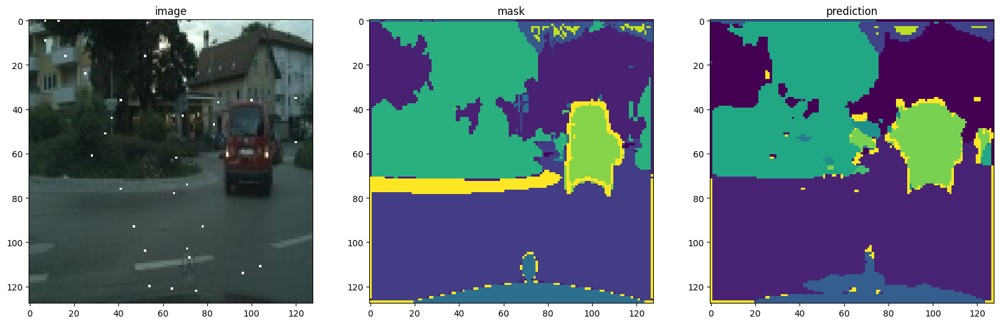

 50%|█████     | 5/10 [06:35<06:36, 79.34s/it]

[Epochs-5/10]:
[Train_loss:0.5548 | Train_acc:0.5164 | Val_loss:0.6990 | Val_acc:0.4579]
--------------------
Validation results after 6 epochs:


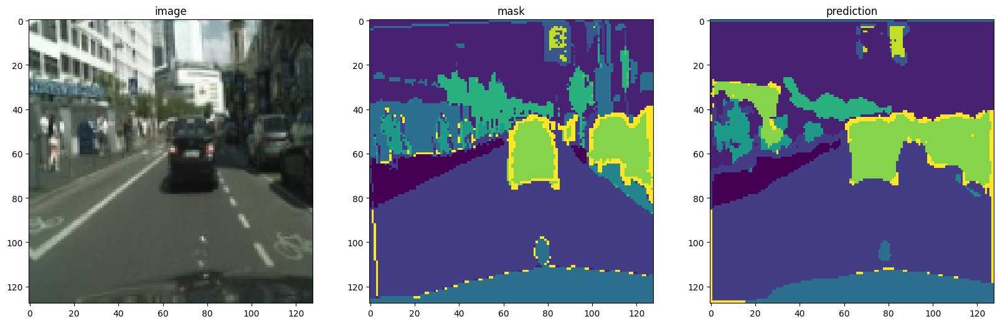

 60%|██████    | 6/10 [07:51<05:13, 78.36s/it]

[Epochs-6/10]:
[Train_loss:0.5348 | Train_acc:0.5274 | Val_loss:0.7097 | Val_acc:0.4579]
--------------------
Validation results after 7 epochs:


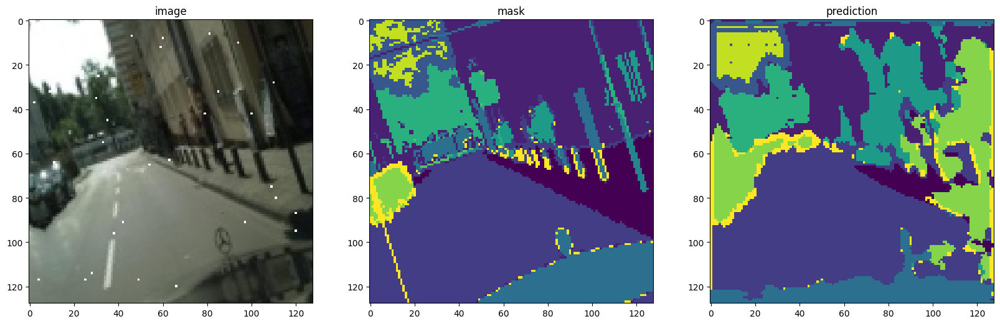

 70%|███████   | 7/10 [09:20<04:05, 81.77s/it]

[Epochs-7/10]:
[Train_loss:0.5251 | Train_acc:0.5323 | Val_loss:0.7115 | Val_acc:0.4618]
--------------------
Validation results after 8 epochs:


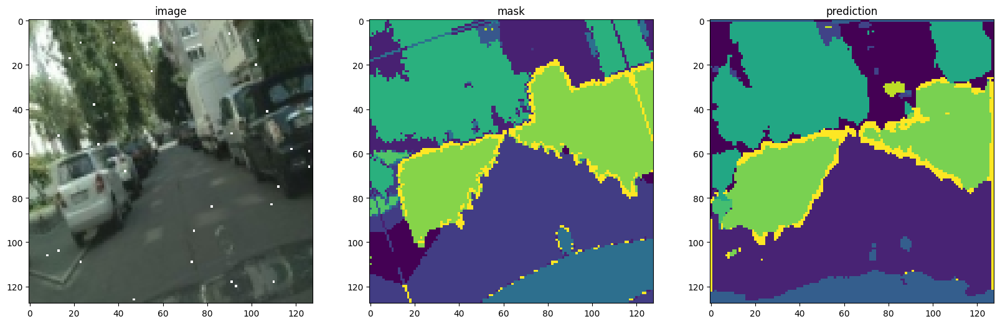

 80%|████████  | 8/10 [10:49<02:48, 84.21s/it]

[Epochs-8/10]:
[Train_loss:0.5138 | Train_acc:0.5394 | Val_loss:0.7614 | Val_acc:0.4573]
--------------------
Validation results after 9 epochs:


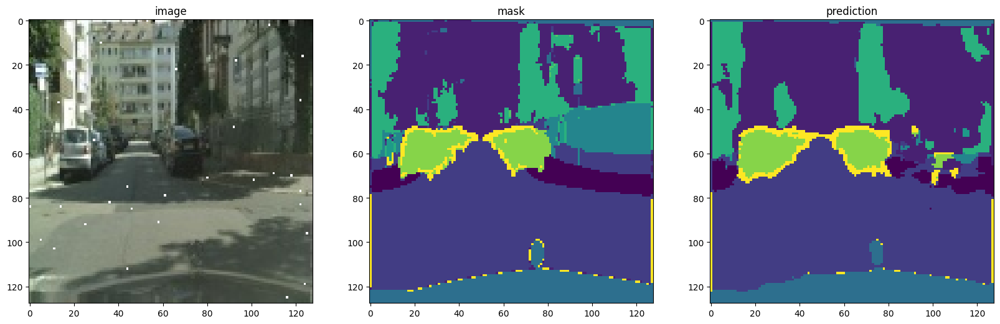

 90%|█████████ | 9/10 [12:25<01:27, 87.72s/it]

[Epochs-9/10]:
[Train_loss:0.4995 | Train_acc:0.5461 | Val_loss:0.7163 | Val_acc:0.4676]
--------------------
Validation results after 10 epochs:


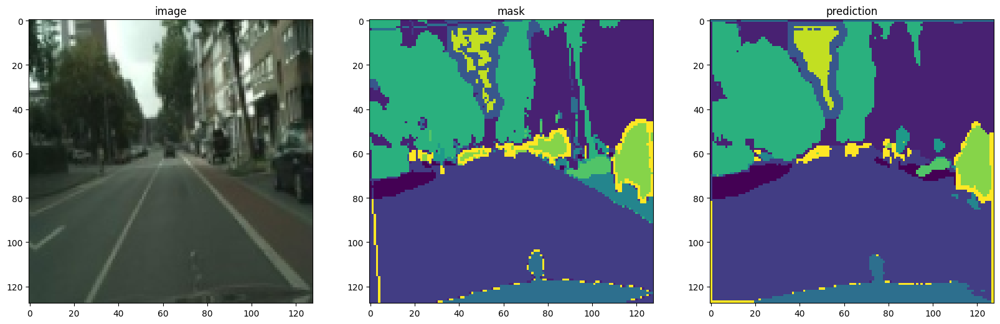

100%|██████████| 10/10 [14:05<00:00, 84.51s/it]

[Epochs-10/10]:
[Train_loss:0.4977 | Train_acc:0.5461 | Val_loss:0.7227 | Val_acc:0.4643]


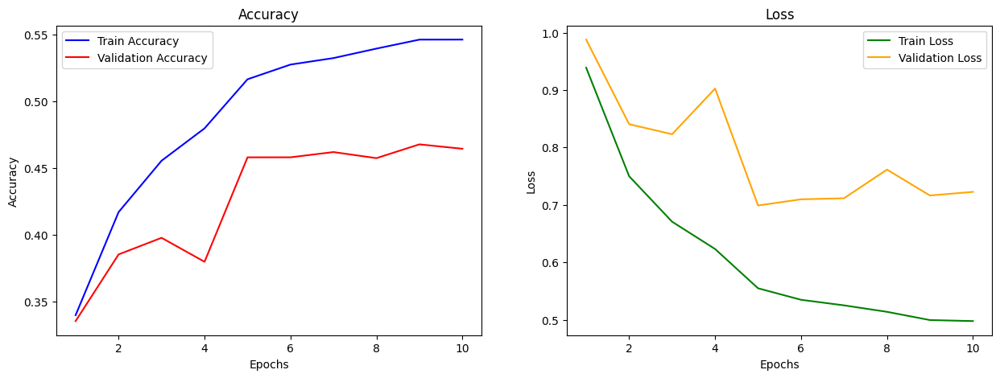

In [93]:
aug1=trainer.train()

In [94]:
torch.save(model.state_dict(), 'model_2.pth')
torch.save(model.state_dict(), 'model_2.pt')

In [95]:
import pickle
pickle.dump(model, open('model_2_pkl.sav', 'wb'))

In [96]:
aug1

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [0.9388976055447773,
  0.7499123585800971,
  0.6707072519967633,
  0.6232049224036996,
  0.5548161802593098,
  0.5347937084333871,
  0.525089268322273,
  0.5138237078984579,
  0.4994924889617069,
  0.49772255451128045],
 [0.33958998232808163,
  0.41683244378910367,
  0.45534877447311717,
  0.47960597287211465,
  0.5163938717185779,
  0.5274186835634058,
  0.5322813859352766,
  0.5393889465498434,
  0.5461187987003161,
  0.5461451199877526],
 [0.9878257986099,
  0.8405177299938504,
  0.8230809266605075,
  0.902553951929486,
  0.6989962595795828,
  0.7097448347106813,
  0.7115371307683369,
  0.7614319296110243,
  0.7163454360432095,
  0.7226994122777667],
 [0.3351421506500253,
  0.3851094325108852,
  0.3975542375724984,
  0.37959394177769573,
  0.4578769557450166,
  0.4579050409125893,
  0.4618339027113918,
  0.45727428125869224,
  0.4676124225626804,
  0.46430708178997854]]

### Low noise model --> Low noise Dataset

In [97]:
unet_aug = Net(num_classes=OUTPUT_CLASSES)

In [98]:
model3 = unet_aug
loss_function = nn.CrossEntropyLoss()

In [99]:
trainer =  Trainer(model = model3,
                  crit = loss_function,
                  train_data = train_data_rot,
                  val_data = val_data_rot,
                  initialize_from_ckp = None,
                  opti_name = OPIMIZER_NAME,
                  scheduler_name = SCHEDULER_NAME,
                  input_img_size = INPUT_IMG_SIZE,
                  batch_size = BATCH_SIZE,
                  out_classes = OUTPUT_CLASSES,
                  use_cuda = USE_CUDA,
                  max_epochs = MAX_EPOCHS,

                  learning_rate = 0.001,
                  thresh_acc = THRESH_ACC_CKP,
                  step_size = SCHEDULER_STEP_SIZE
                 )

  0%|          | 0/10 [00:00<?, ?it/s]

--------------------
Validation results after 1 epochs:


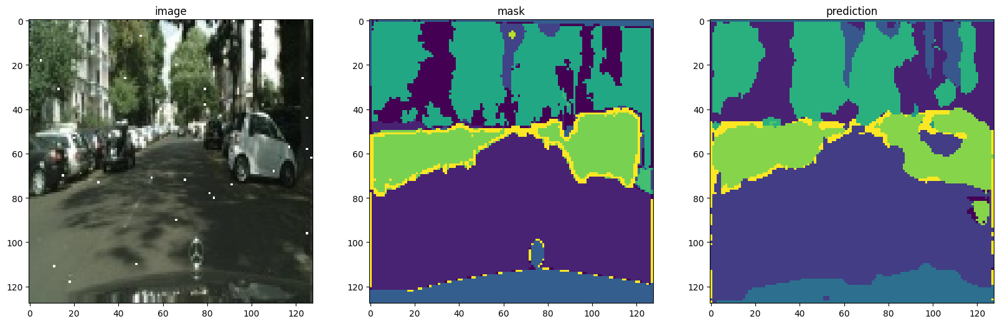

 10%|█         | 1/10 [01:20<12:03, 80.39s/it]

[Epochs-1/10]:
[Train_loss:0.9726 | Train_acc:0.3176 | Val_loss:0.9309 | Val_acc:0.3291]
--------------------
Validation results after 2 epochs:


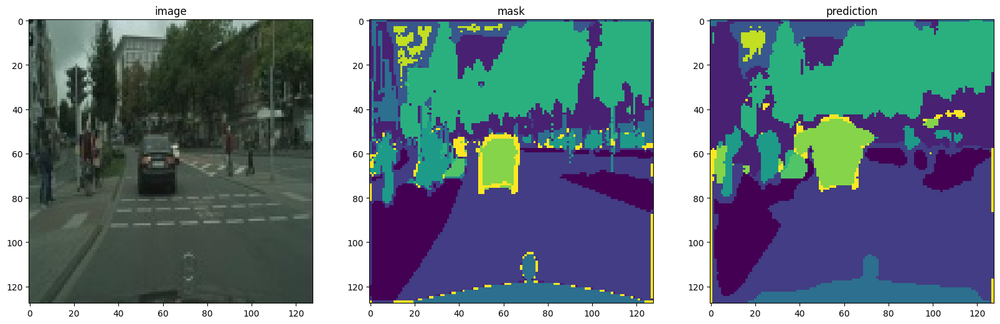

 20%|██        | 2/10 [02:50<11:27, 85.96s/it]

[Epochs-2/10]:
[Train_loss:0.7903 | Train_acc:0.3929 | Val_loss:0.7850 | Val_acc:0.4026]
--------------------
Validation results after 3 epochs:


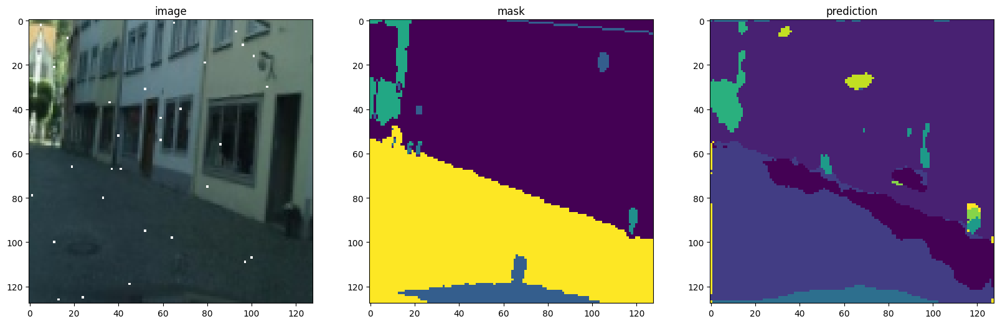

 30%|███       | 3/10 [04:34<11:01, 94.43s/it]

[Epochs-3/10]:
[Train_loss:0.7270 | Train_acc:0.4256 | Val_loss:0.7172 | Val_acc:0.4213]
--------------------
Validation results after 4 epochs:


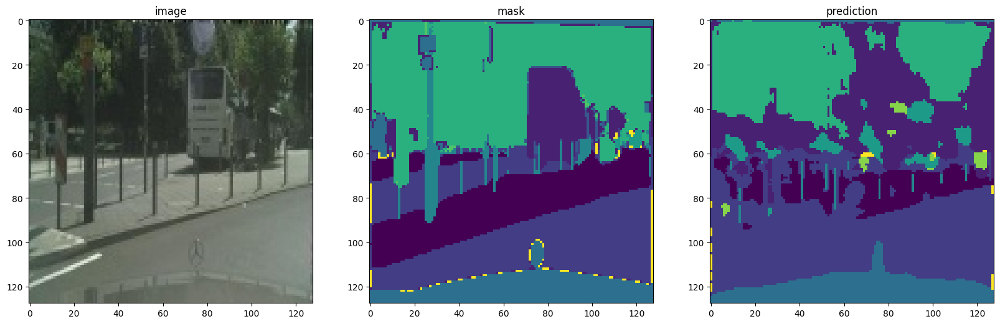

 40%|████      | 4/10 [06:03<09:13, 92.18s/it]

[Epochs-4/10]:
[Train_loss:0.6759 | Train_acc:0.4520 | Val_loss:0.6889 | Val_acc:0.4363]
--------------------
Validation results after 5 epochs:


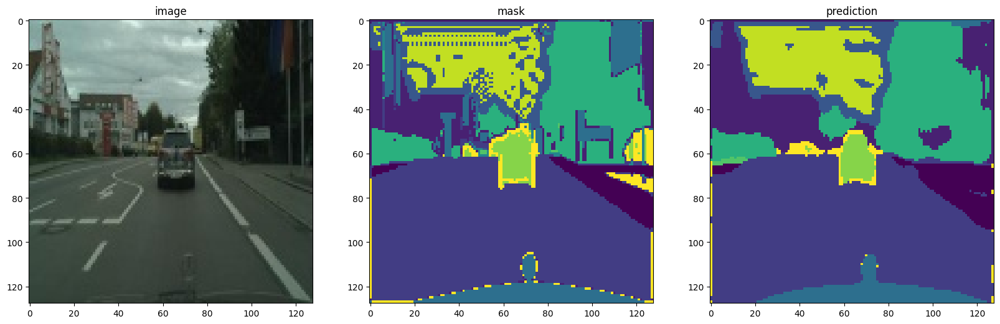

 50%|█████     | 5/10 [07:22<07:16, 87.35s/it]

[Epochs-5/10]:
[Train_loss:0.6038 | Train_acc:0.4864 | Val_loss:0.6118 | Val_acc:0.4760]
--------------------
Validation results after 6 epochs:


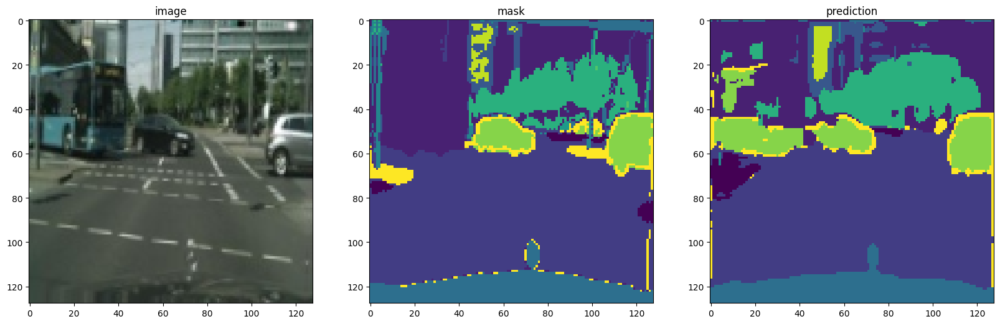

 60%|██████    | 6/10 [08:41<05:38, 84.63s/it]

[Epochs-6/10]:
[Train_loss:0.5898 | Train_acc:0.4937 | Val_loss:0.5957 | Val_acc:0.4833]
--------------------
Validation results after 7 epochs:


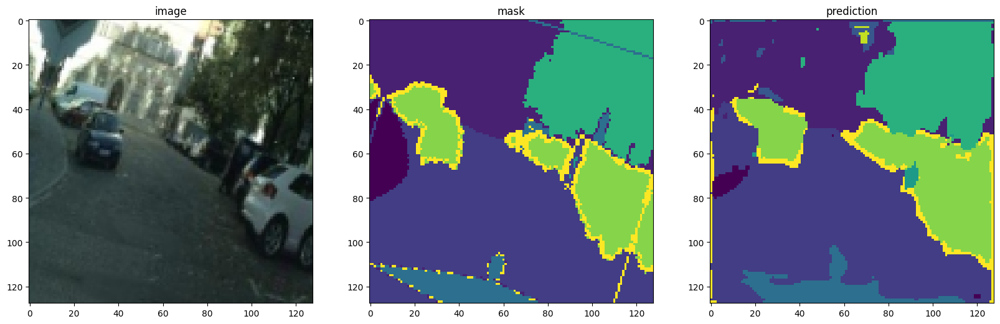

 70%|███████   | 7/10 [10:00<04:08, 82.73s/it]

[Epochs-7/10]:
[Train_loss:0.5831 | Train_acc:0.4981 | Val_loss:0.6045 | Val_acc:0.4791]
--------------------
Validation results after 8 epochs:


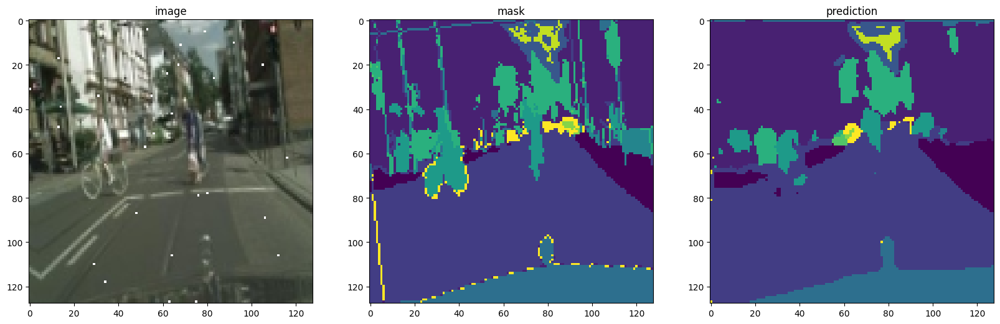

 80%|████████  | 8/10 [11:18<02:42, 81.25s/it]

[Epochs-8/10]:
[Train_loss:0.5743 | Train_acc:0.5025 | Val_loss:0.5941 | Val_acc:0.4855]
--------------------
Validation results after 9 epochs:


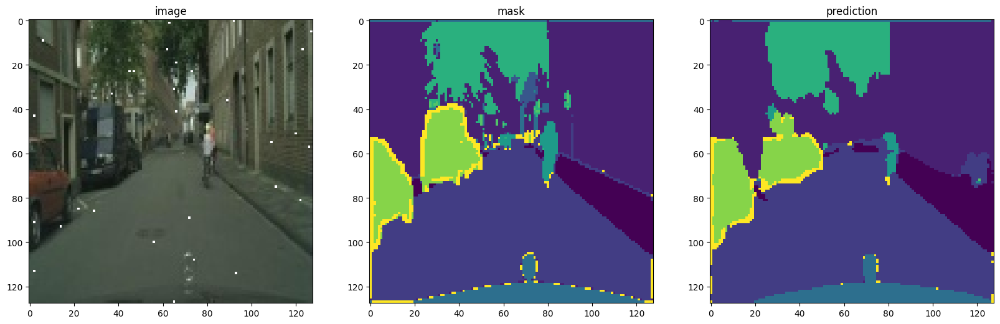

 90%|█████████ | 9/10 [12:37<01:20, 80.42s/it]

[Epochs-9/10]:
[Train_loss:0.5597 | Train_acc:0.5105 | Val_loss:0.5888 | Val_acc:0.4874]
--------------------
Validation results after 10 epochs:


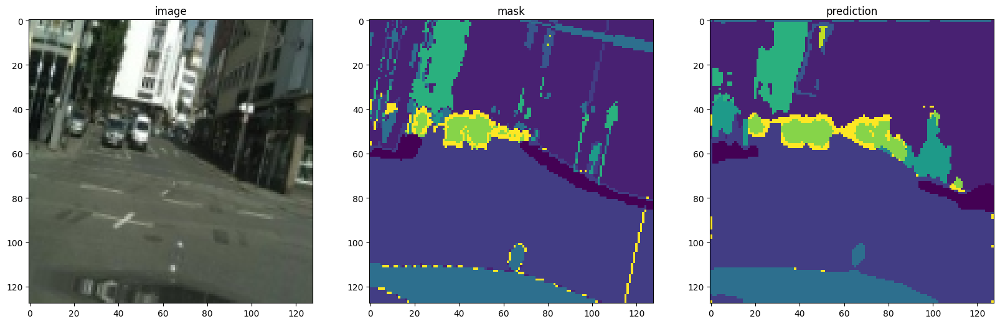

100%|██████████| 10/10 [13:54<00:00, 83.44s/it]

[Epochs-10/10]:
[Train_loss:0.5574 | Train_acc:0.5102 | Val_loss:0.5801 | Val_acc:0.4915]


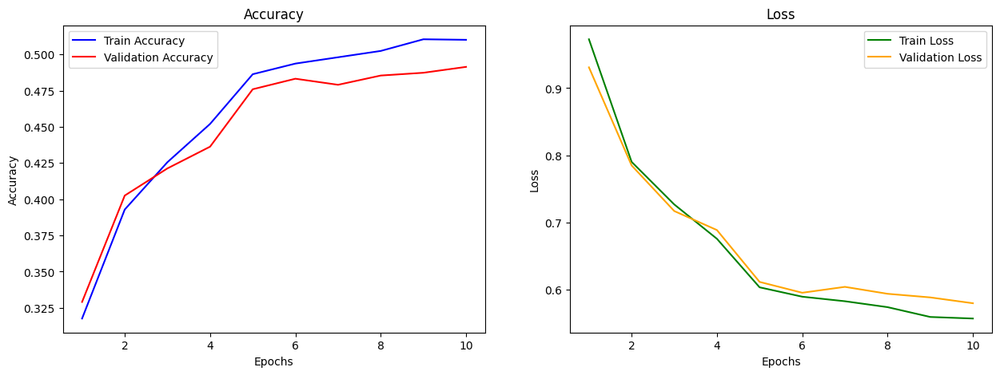

In [100]:
aug2=trainer.train()

In [101]:
torch.save(model.state_dict(), 'model_3.pth')
torch.save(model.state_dict(), 'model_3.pt')

In [102]:
import pickle
pickle.dump(model, open('model_3_pkl.sav', 'wb'))

In [103]:
aug2

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [0.9726206642645662,
  0.7903483949040854,
  0.7269910102890383,
  0.6759433460331732,
  0.603769405074017,
  0.5898260668080341,
  0.583080123909699,
  0.5742679231109158,
  0.5596823690719502,
  0.557357545982125],
 [0.31760318314893593,
  0.39289800371009626,
  0.42559780081312454,
  0.45204185555037846,
  0.4863910846110948,
  0.4937352129017791,
  0.4981065993259869,
  0.502470401347961,
  0.5105306992805961,
  0.5101623950957861],
 [0.9308987969443911,
  0.7850036488638984,
  0.7171813713179694,
  0.6889040574194893,
  0.6118095403625852,
  0.5956909694368877,
  0.6044528512727647,
  0.5941360876673744,
  0.5887622005409665,
  0.5800822490737552],
 [0.3290530669036356,
  0.40255335604688725,
  0.42130929461181266,
  0.436332308112606,
  0.47600061846852587,
  0.4832812255368764,
  0.4790854932850658,
  0.4854792638216341,
  0.4873950344211989,
  0.4914563009706602]]

### Low noise model --> Original Dataset

In [104]:
unet_old = Net(num_classes=OUTPUT_CLASSES)

In [105]:
model4 = unet_old
loss_function = nn.CrossEntropyLoss()

In [106]:
trainer =  Trainer(model = model4,
                  crit = loss_function,
                  train_data = train_data_rot,
                  val_data = val_data_obj,
                  initialize_from_ckp = None,
                  opti_name = OPIMIZER_NAME,
                  scheduler_name = SCHEDULER_NAME,
                  input_img_size = INPUT_IMG_SIZE,
                  batch_size = BATCH_SIZE,
                  out_classes = OUTPUT_CLASSES,
                  use_cuda = USE_CUDA,
                  max_epochs = MAX_EPOCHS,

                  learning_rate = 0.001,
                  thresh_acc = THRESH_ACC_CKP,
                  step_size = SCHEDULER_STEP_SIZE
                 )

  0%|          | 0/10 [00:00<?, ?it/s]

--------------------
Validation results after 1 epochs:


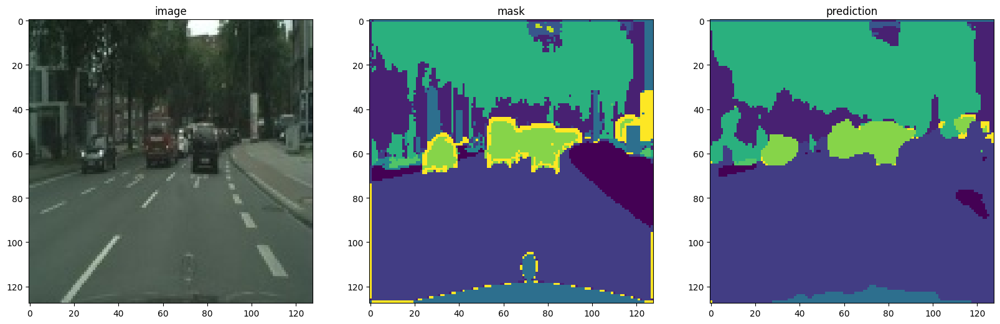

 10%|█         | 1/10 [01:19<11:58, 79.89s/it]

[Epochs-1/10]:
[Train_loss:1.0002 | Train_acc:0.3140 | Val_loss:0.8817 | Val_acc:0.2908]
--------------------
Validation results after 2 epochs:


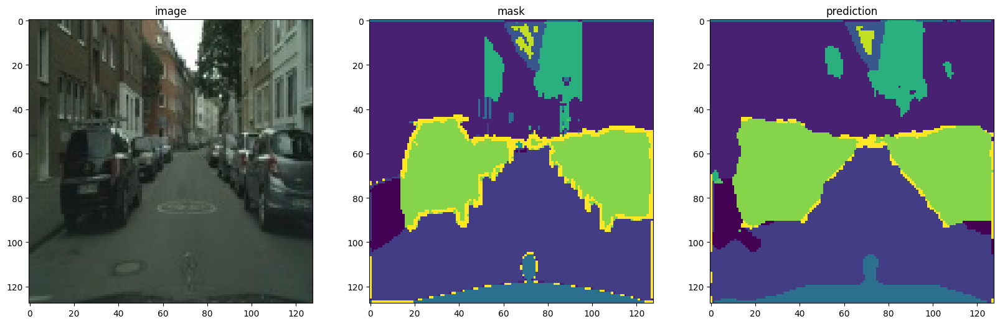

 20%|██        | 2/10 [02:37<10:30, 78.80s/it]

[Epochs-2/10]:
[Train_loss:0.7900 | Train_acc:0.3931 | Val_loss:0.7553 | Val_acc:0.4025]
--------------------
Validation results after 3 epochs:


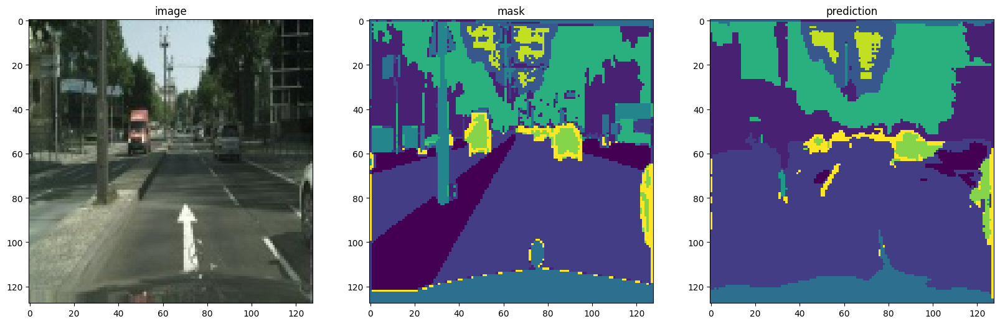

 30%|███       | 3/10 [03:55<09:07, 78.18s/it]

[Epochs-3/10]:
[Train_loss:0.7269 | Train_acc:0.4276 | Val_loss:0.6814 | Val_acc:0.4337]
--------------------
Validation results after 4 epochs:


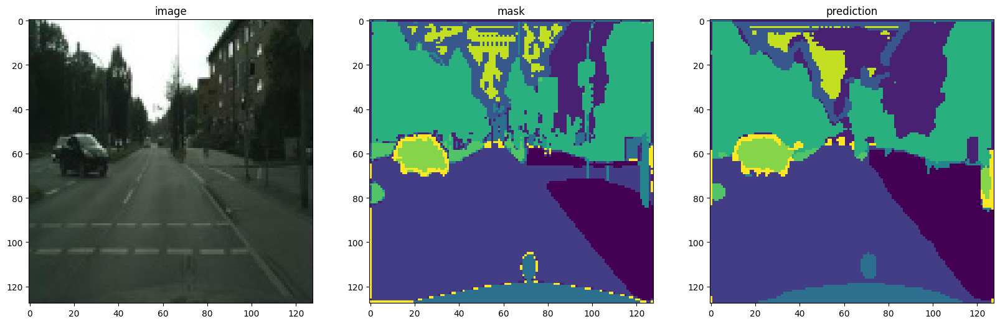

 40%|████      | 4/10 [05:13<07:48, 78.00s/it]

[Epochs-4/10]:
[Train_loss:0.6743 | Train_acc:0.4535 | Val_loss:0.6683 | Val_acc:0.4340]
--------------------
Validation results after 5 epochs:


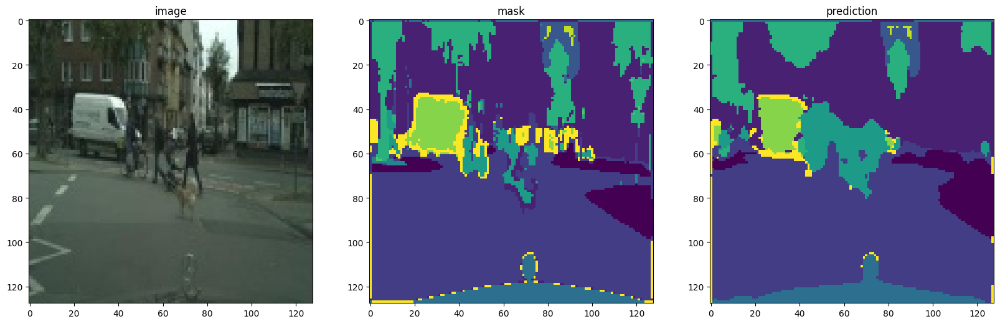

 50%|█████     | 5/10 [06:30<06:29, 77.87s/it]

[Epochs-5/10]:
[Train_loss:0.6060 | Train_acc:0.4881 | Val_loss:0.5762 | Val_acc:0.4988]
--------------------
Validation results after 6 epochs:


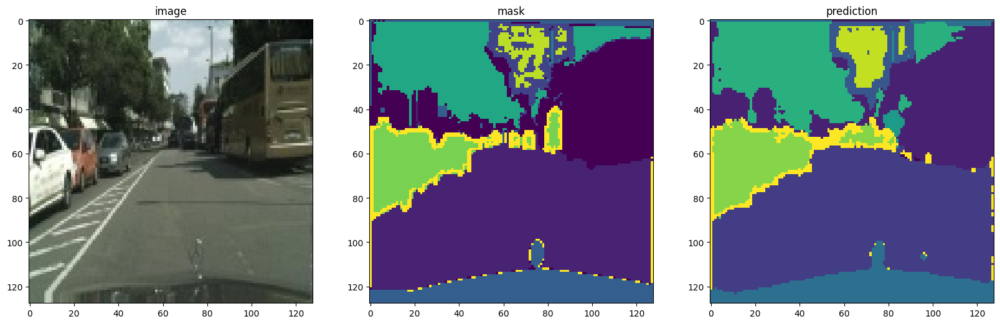

 60%|██████    | 6/10 [07:49<05:12, 78.02s/it]

[Epochs-6/10]:
[Train_loss:0.5879 | Train_acc:0.4979 | Val_loss:0.5645 | Val_acc:0.5053]
--------------------
Validation results after 7 epochs:


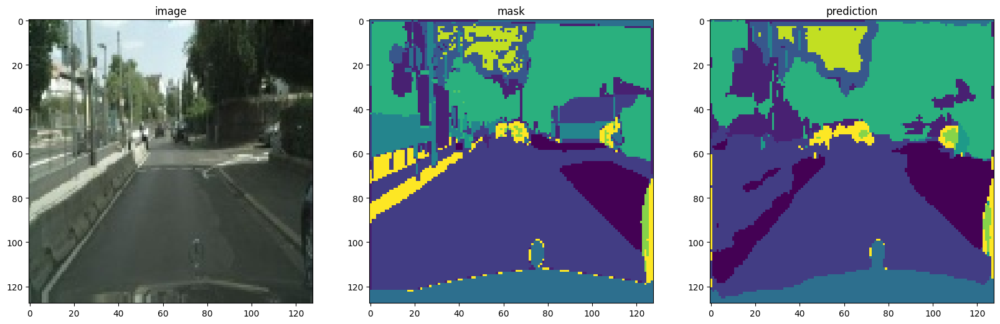

 70%|███████   | 7/10 [09:06<03:53, 77.83s/it]

[Epochs-7/10]:
[Train_loss:0.5788 | Train_acc:0.4998 | Val_loss:0.5603 | Val_acc:0.5023]
--------------------
Validation results after 8 epochs:


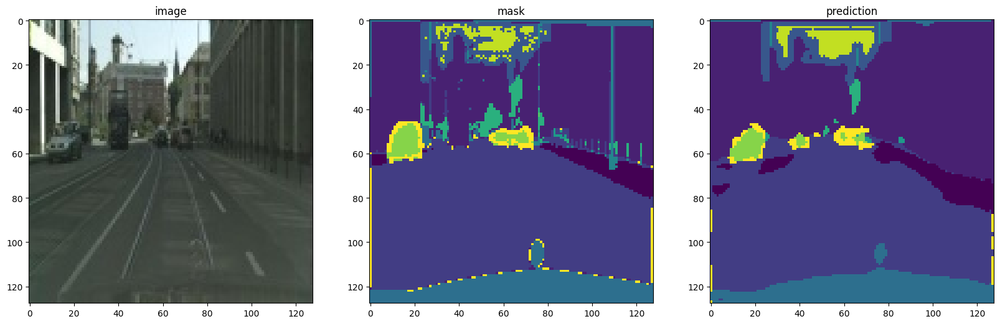

 80%|████████  | 8/10 [10:23<02:35, 77.66s/it]

[Epochs-8/10]:
[Train_loss:0.5701 | Train_acc:0.5050 | Val_loss:0.5593 | Val_acc:0.5034]
--------------------
Validation results after 9 epochs:


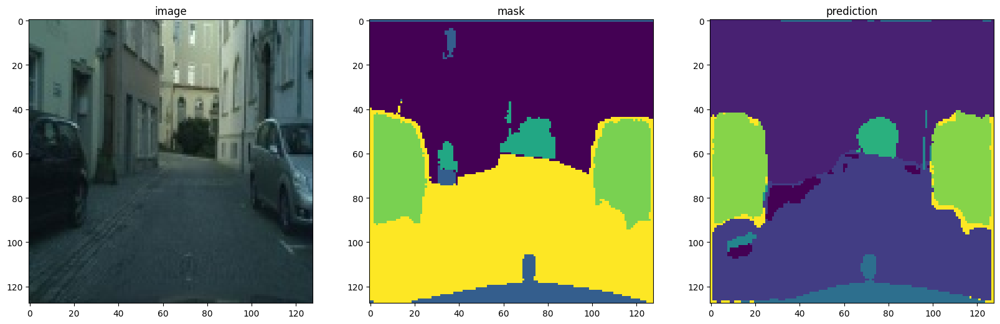

 90%|█████████ | 9/10 [11:41<01:17, 77.82s/it]

[Epochs-9/10]:
[Train_loss:0.5554 | Train_acc:0.5130 | Val_loss:0.5498 | Val_acc:0.5118]
--------------------
Validation results after 10 epochs:


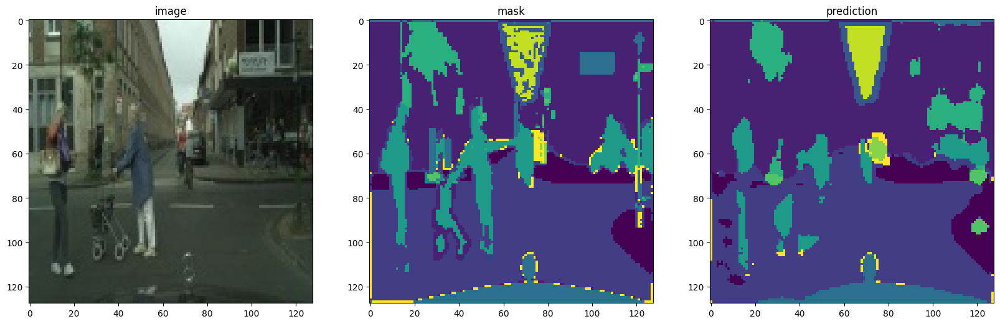

100%|██████████| 10/10 [13:00<00:00, 78.04s/it]

[Epochs-10/10]:
[Train_loss:0.5533 | Train_acc:0.5125 | Val_loss:0.5451 | Val_acc:0.5140]


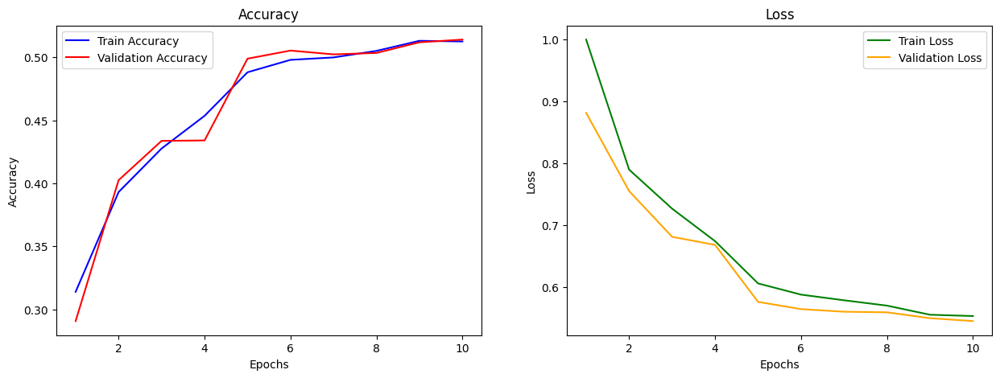

In [107]:
aug3=trainer.train()

In [108]:
torch.save(model.state_dict(), 'model_4.pth')
torch.save(model.state_dict(), 'model_4.pt')

In [109]:
import pickle
pickle.dump(model, open('model_4_pkl.sav', 'wb'))

In [110]:
aug3

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [1.0002090477494783,
  0.7899532846866115,
  0.7268919025057106,
  0.6743353142212796,
  0.6060399382665593,
  0.5878859149512424,
  0.5787733705934658,
  0.5701058042305772,
  0.5553786394897328,
  0.5532724929432715],
 [0.3139851064721453,
  0.3930757806761635,
  0.42759947247850827,
  0.45350517096088266,
  0.488058788899479,
  0.4979042054579658,
  0.4998190161737175,
  0.5050178919792989,
  0.5130085693256518,
  0.5124900771803567],
 [0.8817048508023458,
  0.755331261763497,
  0.6813643697708373,
  0.6682700122159625,
  0.5761713026061891,
  0.5644751560120356,
  0.5602541915954106,
  0.5592788618708414,
  0.5498094814164298,
  0.5451325627546462],
 [0.29078682688692215,
  0.402489295945594,
  0.43367000925492943,
  0.43401189629898124,
  0.49884682200578523,
  0.5052625252250202,
  0.5022524912815509,
  0.5033840018451641,
  0.5118281503280454,
  0.513972916189402]]


### High noise model --> Low Noise Dataset

In [118]:
unet_hg = Net(num_classes=OUTPUT_CLASSES)

In [119]:
model5 = unet_hg
loss_function = nn.CrossEntropyLoss()

In [120]:
trainer =  Trainer(model = model5,
                  crit = loss_function,
                  train_data = train_data_aug,
                  val_data = val_data_rot,
                  initialize_from_ckp = None,
                  opti_name = OPIMIZER_NAME,
                  scheduler_name = SCHEDULER_NAME,
                  input_img_size = INPUT_IMG_SIZE,
                  batch_size = BATCH_SIZE,
                  out_classes = OUTPUT_CLASSES,
                  use_cuda = USE_CUDA,
                  max_epochs = MAX_EPOCHS,
                  #  max_epochs = 5,
                  learning_rate = 0.001,
                  thresh_acc = THRESH_ACC_CKP,
                  step_size = SCHEDULER_STEP_SIZE
                 )

  0%|          | 0/10 [00:00<?, ?it/s]

--------------------
Validation results after 1 epochs:


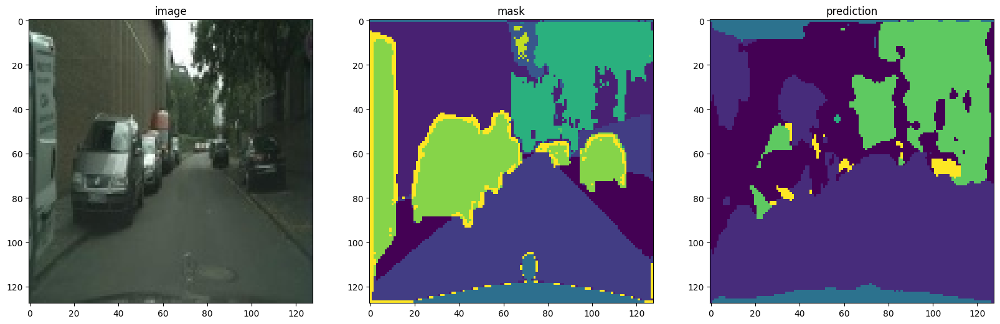

 10%|█         | 1/10 [01:45<15:53, 105.92s/it]

[Epochs-1/10]:
[Train_loss:1.4357 | Train_acc:0.1888 | Val_loss:1.1180 | Val_acc:0.2168]
--------------------
Validation results after 2 epochs:


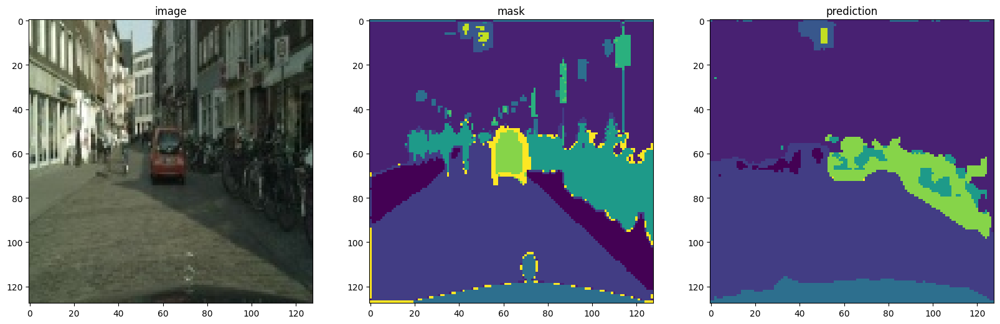

 20%|██        | 2/10 [03:31<14:06, 105.76s/it]

[Epochs-2/10]:
[Train_loss:1.1823 | Train_acc:0.2437 | Val_loss:0.9852 | Val_acc:0.2960]
--------------------
Validation results after 3 epochs:


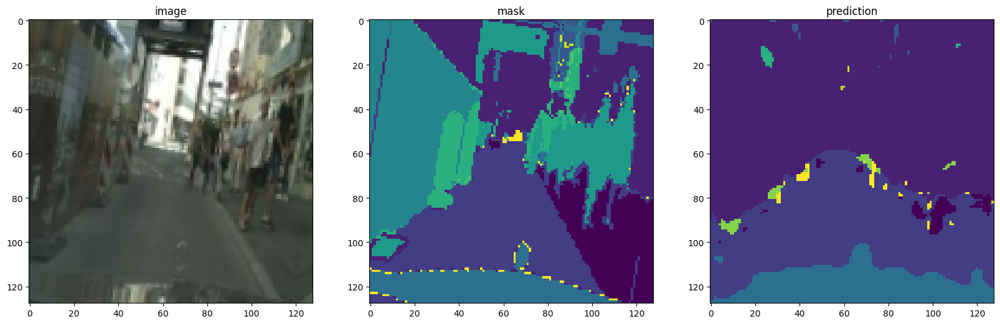

 30%|███       | 3/10 [05:17<12:19, 105.69s/it]

[Epochs-3/10]:
[Train_loss:1.0992 | Train_acc:0.2698 | Val_loss:0.9533 | Val_acc:0.3148]
--------------------
Validation results after 4 epochs:


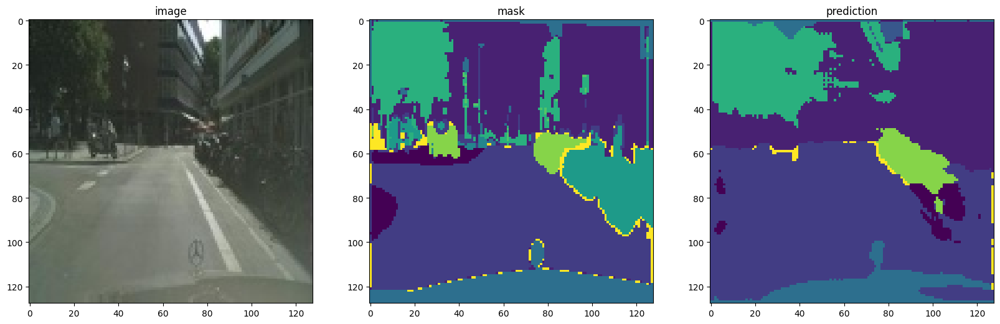

 40%|████      | 4/10 [07:04<10:38, 106.42s/it]

[Epochs-4/10]:
[Train_loss:1.0443 | Train_acc:0.2915 | Val_loss:0.9012 | Val_acc:0.3365]
--------------------
Validation results after 5 epochs:


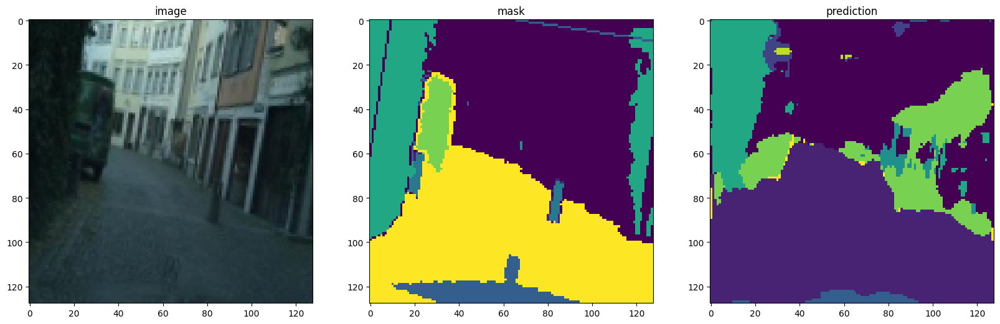

 50%|█████     | 5/10 [08:50<08:50, 106.14s/it]

[Epochs-5/10]:
[Train_loss:0.9558 | Train_acc:0.3270 | Val_loss:0.7986 | Val_acc:0.3710]
--------------------
Validation results after 6 epochs:


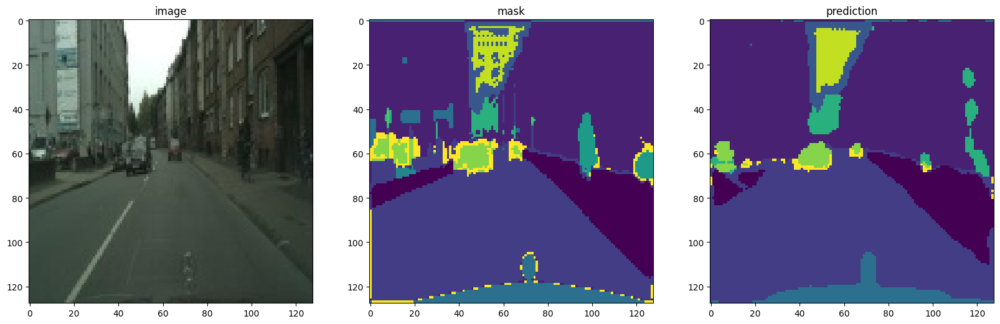

 60%|██████    | 6/10 [10:35<07:03, 105.92s/it]

[Epochs-6/10]:
[Train_loss:0.9248 | Train_acc:0.3365 | Val_loss:0.7793 | Val_acc:0.3819]
--------------------
Validation results after 7 epochs:


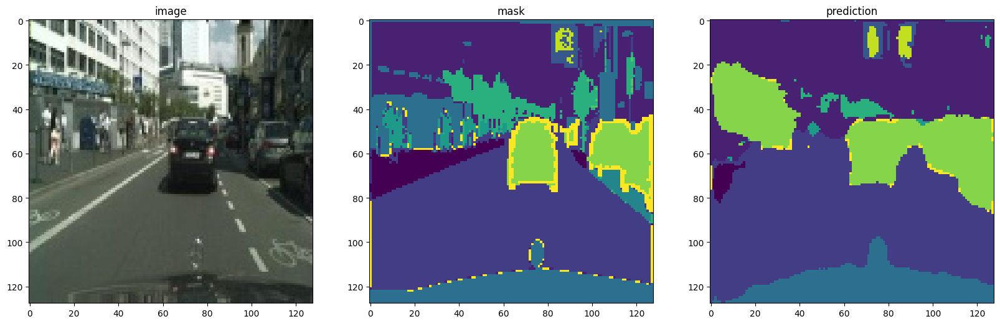

 70%|███████   | 7/10 [12:19<05:15, 105.06s/it]

[Epochs-7/10]:
[Train_loss:0.9055 | Train_acc:0.3444 | Val_loss:0.7775 | Val_acc:0.3780]
--------------------
Validation results after 8 epochs:


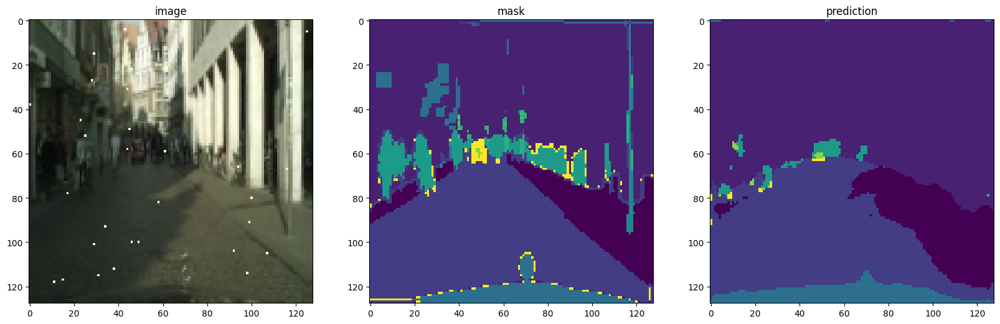

 80%|████████  | 8/10 [14:05<03:30, 105.34s/it]

[Epochs-8/10]:
[Train_loss:0.9012 | Train_acc:0.3485 | Val_loss:0.7616 | Val_acc:0.3852]
--------------------
Validation results after 9 epochs:


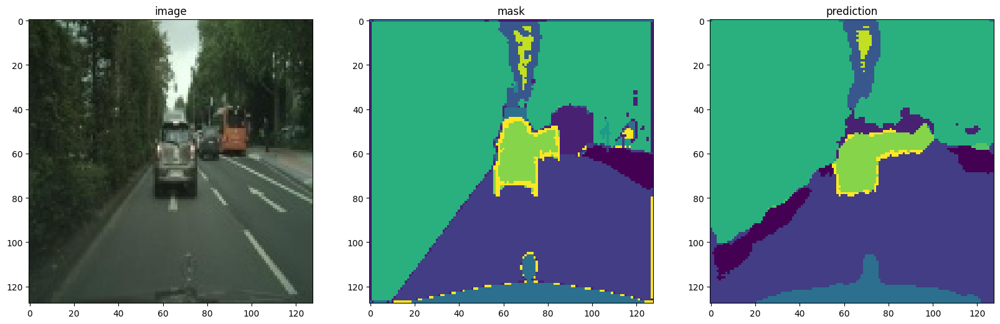

 90%|█████████ | 9/10 [15:51<01:45, 105.67s/it]

[Epochs-9/10]:
[Train_loss:0.8905 | Train_acc:0.3518 | Val_loss:0.7478 | Val_acc:0.3962]
--------------------
Validation results after 10 epochs:


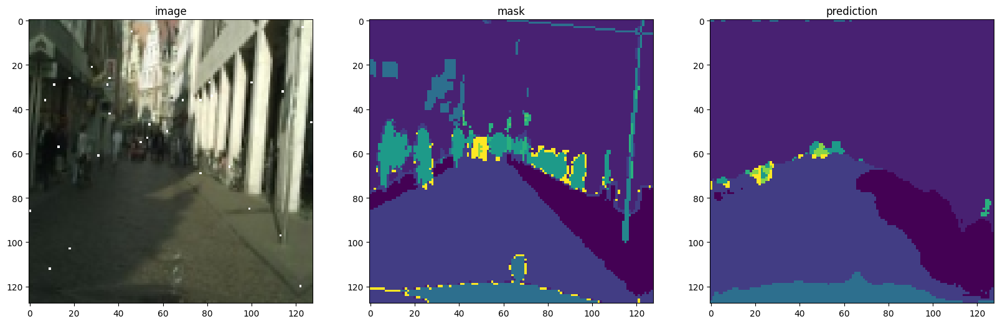

100%|██████████| 10/10 [17:37<00:00, 105.73s/it]

[Epochs-10/10]:
[Train_loss:0.8851 | Train_acc:0.3537 | Val_loss:0.7539 | Val_acc:0.3958]


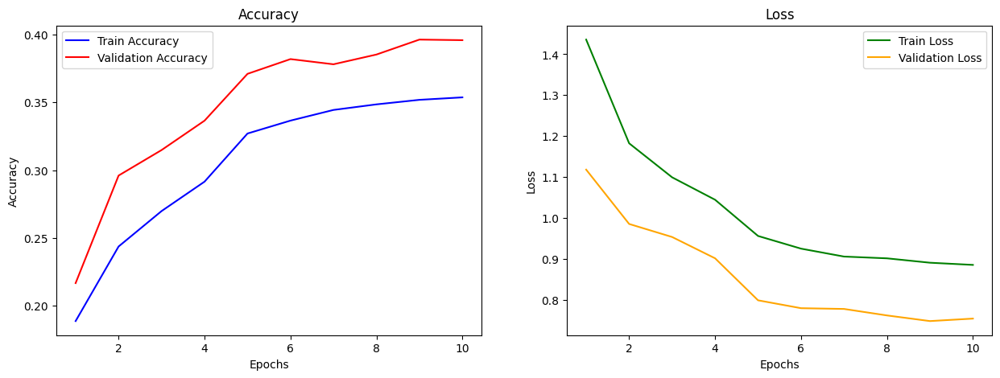

In [121]:
aug4=trainer.train()

In [122]:
torch.save(model.state_dict(), 'model_5.pth')
torch.save(model.state_dict(), 'model_5.pt')

In [123]:
import pickle
pickle.dump(model, open('model_5_pkl.sav', 'wb'))

In [124]:
aug4

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [1.435735095252273,
  1.1822757539890145,
  1.0991631645348765,
  1.044324638061626,
  0.9558172064122333,
  0.9248459686835607,
  0.9054903689251151,
  0.9011549595543134,
  0.8904534331572953,
  0.8851189606933183],
 [0.18876816451940837,
  0.24373849988057675,
  0.26984912555789164,
  0.2915317023715305,
  0.32701353241373454,
  0.336519949558049,
  0.3443824239412571,
  0.34849105441041794,
  0.3518376769857281,
  0.3536593342632845],
 [1.1179557404820881,
  0.9851697513035366,
  0.9533143904474046,
  0.9012418833989946,
  0.7985693774526081,
  0.7793174773927719,
  0.7774782786293636,
  0.7616089279689486,
  0.7478294429324922,
  0.7539002374997215],
 [0.2167595634143112,
  0.2960264545396399,
  0.3148216180616928,
  0.33648274360583574,
  0.3709956769871863,
  0.3818603220614879,
  0.37803284217748273,
  0.38522178632879844,
  0.3962368102257191,
  0.39581283586999816]]


### Low noise model --> High Noise Dataset

In [240]:
unet_new = Net(num_classes=OUTPUT_CLASSES)

In [241]:
model6 = unet_new
loss_function = nn.CrossEntropyLoss()

In [242]:
trainer =  Trainer(model = model6,
                  crit = loss_function,
                  train_data = train_data_rot,
                  val_data = val_data_aug,
                  initialize_from_ckp = None,
                  opti_name = OPIMIZER_NAME,
                  scheduler_name = SCHEDULER_NAME,
                  input_img_size = INPUT_IMG_SIZE,
                  batch_size = BATCH_SIZE,
                  out_classes = OUTPUT_CLASSES,
                  use_cuda = USE_CUDA,
                  max_epochs = MAX_EPOCHS,
                  #  max_epochs = 5,
                  learning_rate = 0.001,
                  thresh_acc = THRESH_ACC_CKP,
                  step_size = SCHEDULER_STEP_SIZE
                 )

  0%|          | 0/10 [00:00<?, ?it/s]

--------------------
Validation results after 1 epochs:


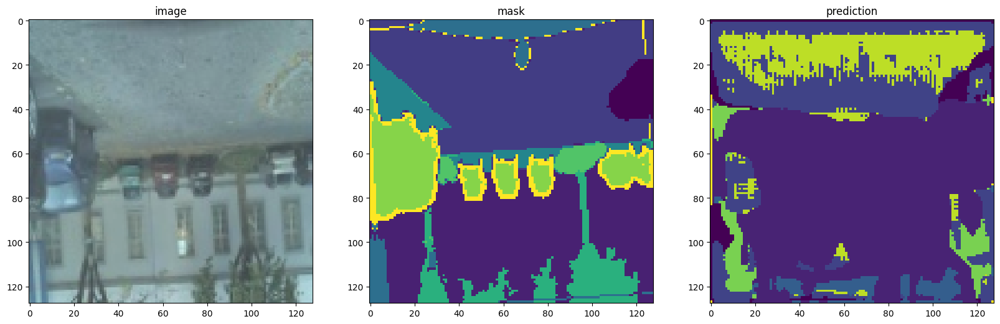

 10%|█         | 1/10 [01:23<12:33, 83.70s/it]

[Epochs-1/10]:
[Train_loss:0.9668 | Train_acc:0.3254 | Val_loss:2.2082 | Val_acc:0.2012]
--------------------
Validation results after 2 epochs:


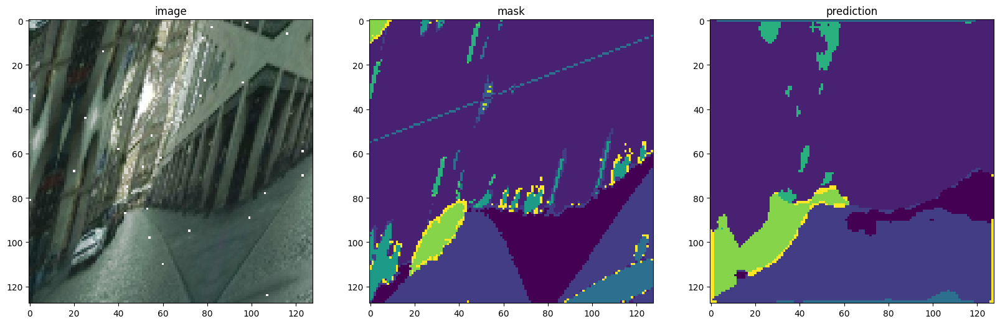

 20%|██        | 2/10 [02:46<11:05, 83.14s/it]

[Epochs-2/10]:
[Train_loss:0.7827 | Train_acc:0.4001 | Val_loss:2.2228 | Val_acc:0.1993]
--------------------
Validation results after 3 epochs:


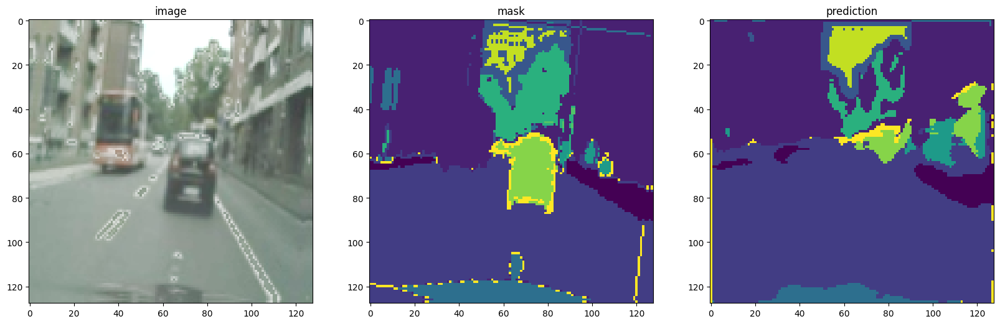

 30%|███       | 3/10 [04:17<10:06, 86.57s/it]

[Epochs-3/10]:
[Train_loss:0.7149 | Train_acc:0.4308 | Val_loss:1.7633 | Val_acc:0.2361]
--------------------
Validation results after 4 epochs:


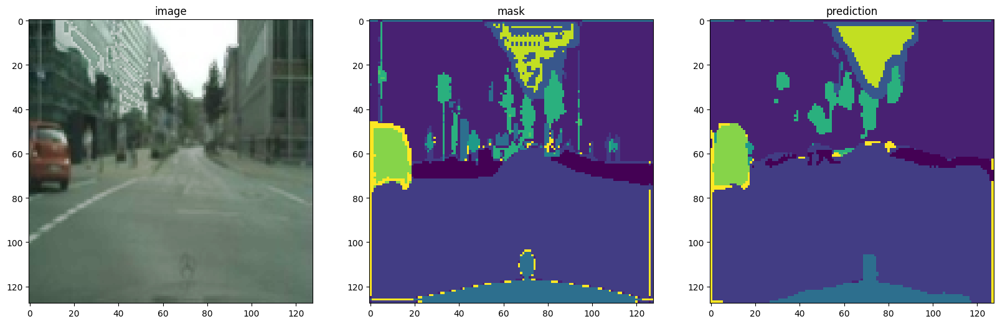

 40%|████      | 4/10 [05:51<08:57, 89.52s/it]

[Epochs-4/10]:
[Train_loss:0.6793 | Train_acc:0.4480 | Val_loss:1.8423 | Val_acc:0.2360]
--------------------
Validation results after 5 epochs:


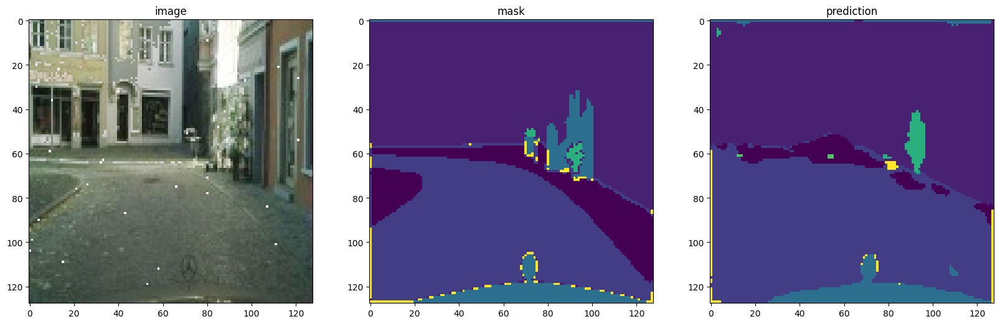

 50%|█████     | 5/10 [07:15<07:17, 87.51s/it]

[Epochs-5/10]:
[Train_loss:0.6086 | Train_acc:0.4854 | Val_loss:1.6892 | Val_acc:0.2689]
--------------------
Validation results after 6 epochs:


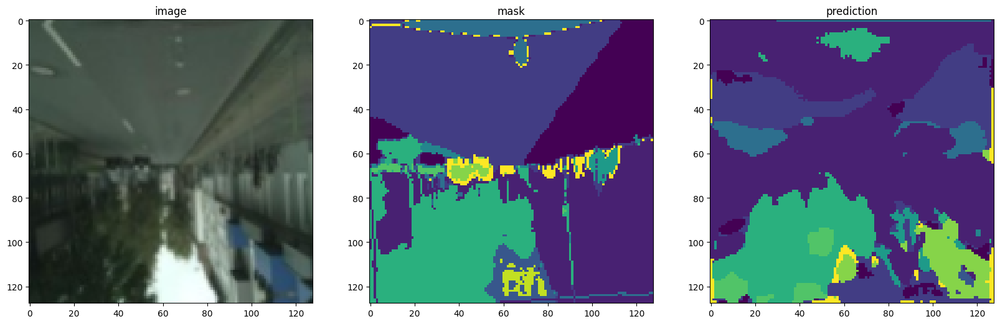

 60%|██████    | 6/10 [08:39<05:45, 86.38s/it]

[Epochs-6/10]:
[Train_loss:0.5882 | Train_acc:0.4964 | Val_loss:1.8244 | Val_acc:0.2491]
--------------------
Validation results after 7 epochs:


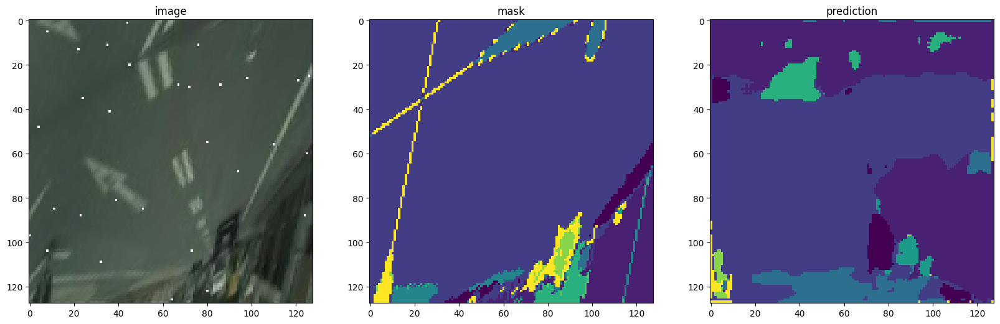

 70%|███████   | 7/10 [10:02<04:16, 85.49s/it]

[Epochs-7/10]:
[Train_loss:0.5812 | Train_acc:0.5006 | Val_loss:1.8977 | Val_acc:0.2526]
--------------------
Validation results after 8 epochs:


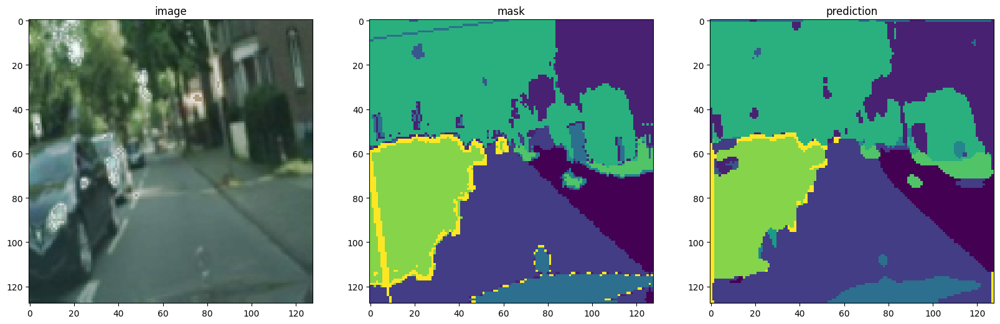

 80%|████████  | 8/10 [11:32<02:53, 86.79s/it]

[Epochs-8/10]:
[Train_loss:0.5685 | Train_acc:0.5069 | Val_loss:1.9215 | Val_acc:0.2568]
--------------------
Validation results after 9 epochs:


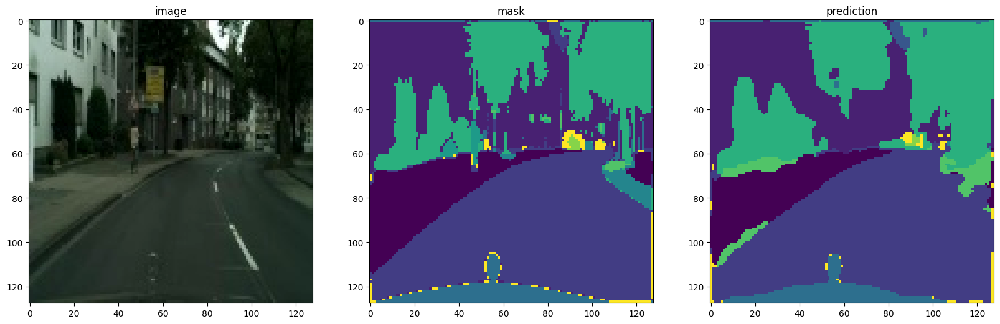

 90%|█████████ | 9/10 [12:55<01:25, 85.74s/it]

[Epochs-9/10]:
[Train_loss:0.5551 | Train_acc:0.5131 | Val_loss:1.8854 | Val_acc:0.2575]
--------------------
Validation results after 10 epochs:


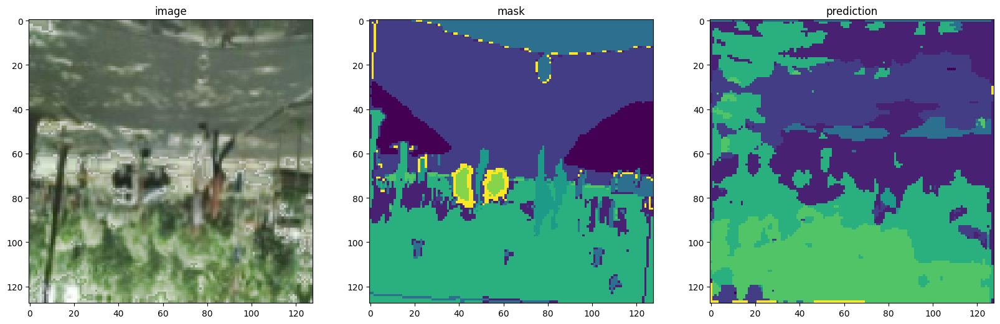

100%|██████████| 10/10 [14:21<00:00, 86.16s/it]

[Epochs-10/10]:
[Train_loss:0.5540 | Train_acc:0.5152 | Val_loss:1.6901 | Val_acc:0.2835]


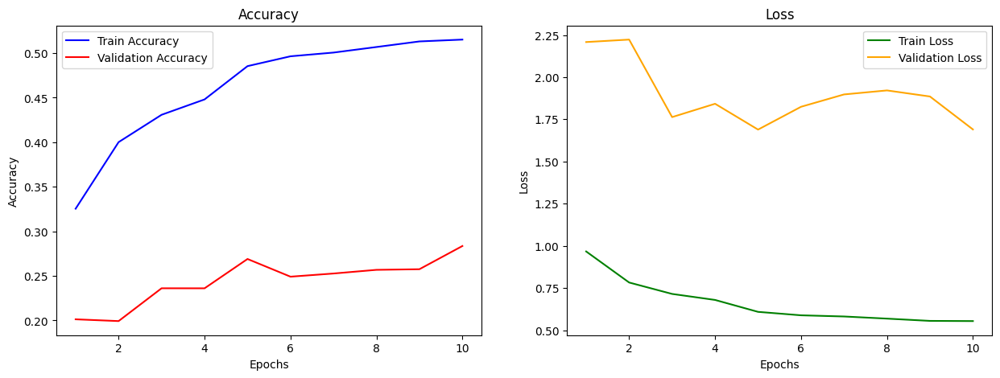

In [243]:
aug5=trainer.train()

In [244]:
torch.save(model.state_dict(), 'model_6.pth')
torch.save(model.state_dict(), 'model_6.pt')

In [245]:
aug5

[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 [0.9667551559145733,
  0.7826538438438088,
  0.7149365757421781,
  0.6792744953305491,
  0.6086118959931917,
  0.5882249461707248,
  0.5812309645516898,
  0.5685243246055418,
  0.555103578795028,
  0.5539710192430404],
 [0.32537594475986564,
  0.40009464286916785,
  0.4307792816780524,
  0.448024633637617,
  0.4854022703579787,
  0.4964479527696778,
  0.5006107834397057,
  0.5068584307144587,
  0.5131296909865437,
  0.5151932340643901],
 [2.208220835716005,
  2.222828912356543,
  1.763268024202377,
  1.8423218670345487,
  1.6892386268055628,
  1.8244279585187397,
  1.8976858911060153,
  1.9214674338461861,
  1.8854325990828256,
  1.6901333492899697],
 [0.20124864202452294,
  0.199260382186557,
  0.23607334749707118,
  0.2360376722150675,
  0.26894546752734655,
  0.24909387578597794,
  0.2526439333631981,
  0.2567720558772771,
  0.25747400936992787,
  0.2835061344977553]]

## Comparative Analysis

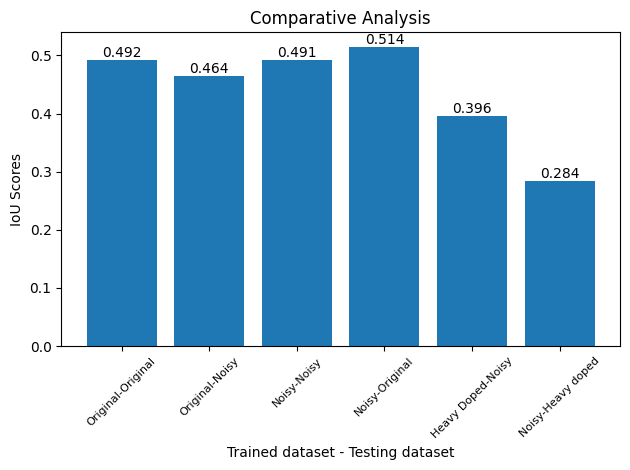

In [247]:
x = 4
values = [base[x][9], aug1[x][9], aug2[x][9], aug3[x][9], aug4[x][9], aug5[x][9]]

fig, ax = plt.subplots()
bar = ax.bar(range(1, 7), values)
ax.set_xticks(range(1, 7))
ax.set_xticklabels(['Original-Original', 'Original-Noisy', 'Noisy-Noisy', 'Noisy-Original', 'Heavy Doped-Noisy', 'Noisy-Heavy doped'], rotation=45, fontsize=8)
plt.xlabel('Trained dataset - Testing dataset')
plt.ylabel('IoU Scores')
plt.title('Comparative Analysis')

for i in range(6):
    ax.annotate(f"{values[i]:.3f}", (i + 1, values[i]), ha='center', va='bottom')

plt.tight_layout()
plt.show()